# Practical Machine Learning for Physicists
## Week 6 Exercise 
## Deadline Monday 30th November at 12pm (Noon)

In this notebook you will be trying to predict a system using incomplete information. We will set up the equations of motions for a simple double pendulum (or should that be a double simple pendulum. Then we will see if a machine learning technique can predict the future position of the lower mass, using only the lower mass positions.

### Kinematics of the double pendulum
Let's specify our problem in terms of the following, with the origin at the pivot point of the top pendulum. This is just background for the machine learning tasks at the bottom of the notebook.

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$ 


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$ 
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where 
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import solve_ivp
from sklearn.model_selection import train_test_split

#Import tqdm for progress bar
from tqdm import tqdm

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

In [2]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulum
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2


def double_motion(t):
    '''
    Function that outputs the coordinates generated from a set of t values
    '''
    
    # Solve initial value problem
    ret = solve_ivp(rhs, (0,tmax), z0, t_eval=np.arange(0, tmax+dt, dt), args=(L1, L2, m1, m2, g))
    z=ret.y
    #print(np.shape(z))

    # Extract result
    theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
        
    w1, w1dot, w2, w2dot = rhs(t,z,L1,L2,m1,m2,g)
    x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
    return x1, y1, x2, y2


In [3]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [4]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


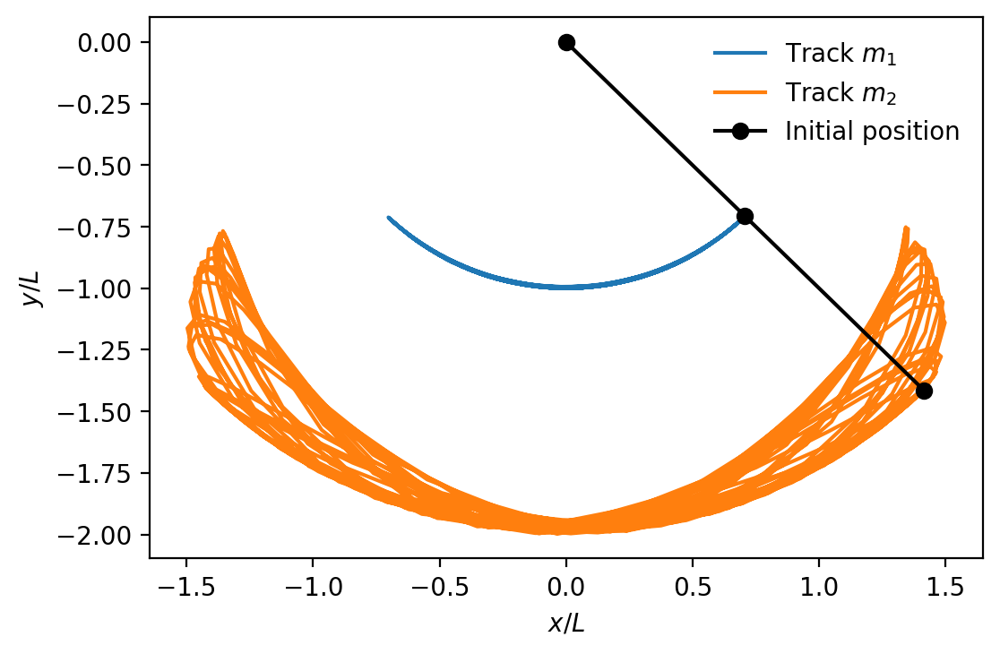

In [5]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Exercises: Predicting Chaos
1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 
2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp
3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)
4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.
5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)



### 1. Design RNN
Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 

shapeArray has been adapted from the Prediction source notebook. It will separate the position (or any) data into specified windowsizes to predict a given 'offset' position into the future. Throughout this notebook, the windowsize and offset will generally be set to 20, except when testing different offsets/extrapolation times.

In [6]:
def shapeArray(x,windowsize,offset):
    '''
    Separates into batches, code from the predictions notebook
    Inputs: x, windowsize, offset
    Outputs: (xInput, xLabel)
    '''

    # Set of inputs
    xInput= np.array([x[i : i + windowsize] for i in range(len(x)-(windowsize+offset)+1)])

    # Set of outputs
    xLabel= np.array([x[ i+ windowsize+offset-1] for i in range(len(x)-(windowsize+offset)+1)])
    
    return (xInput,xLabel)

windowsize=20 #Number of samples we will use to train our network
offset=20 #How many samples into the future to predict

getTestTrain will split the current data set into a training and test dataset, split by 60% training. 

Note: The test set has been set to the entire dataset, including the 40% not used for training. But this can be changed to only 40% if chosen to do so.

In [7]:
def getTestTrain(x1, y1, x2, y2, z0=[np.pi/4,0,np.pi/4,0], windowsize=20, offset=20):
  '''
  This function will generate a training and test dataset
  Inputs: x1, y1, x2, y2, z0, windowsizde, offset
  Outputs: train_inputs, train_labels, test_inputs, test_labels
  '''
  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Number of samples
  n_samples_1 = x1.shape[0]
  n_samples_2 = x2.shape[0]
  # Training set
  n_train_1 = int(0.6 * n_samples_1)
  n_train_2 = int(0.6 * n_samples_2)

  # Split the data into training and test sets
  x1_train, x1_test = x1[:n_train_1], x1#[n_train_1:]
  y1_train, y1_test = y1[:n_train_1], y1#[n_train_1:]
  x2_train, x2_test = x2[:n_train_2], x2#[n_train_2:]
  y2_train, y2_test = y2[:n_train_2], y2#[n_train_2:]

  # Arrange into correct shape
  x1_train_input, x1_train_label = shapeArray(x1_train, windowsize=windowsize, offset=offset)
  x2_train_input, x2_train_label = shapeArray(x2_train, windowsize=windowsize, offset=offset)
  y1_train_input, y1_train_label = shapeArray(y1_train, windowsize=windowsize, offset=offset)
  y2_train_input, y2_train_label = shapeArray(y2_train, windowsize=windowsize, offset=offset)

  # Put together in one array
  train_inputs = np.array([x1_train_input.T, y1_train_input.T, x2_train_input.T, y2_train_input.T]).T
  train_labels = np.array([x1_train_label.T, y1_train_label.T, x2_train_label.T, y2_train_label.T]).T

  # Arrange into correct shape
  x1_test_input, x1_test_label = shapeArray(x1_test, windowsize=windowsize, offset=offset)
  x2_test_input, x2_test_label = shapeArray(x2_test, windowsize=windowsize, offset=offset)
  y1_test_input, y1_test_label = shapeArray(y1_test, windowsize=windowsize, offset=offset)
  y2_test_input, y2_test_label = shapeArray(y2_test, windowsize=windowsize, offset=offset)

  # Put together in one array
  test_inputs = np.array([x1_test_input.T, y1_test_input.T, x2_test_input.T, y2_test_input.T]).T
  test_labels = np.array([x1_test_label.T, y1_test_label.T, x2_test_label.T, y2_test_label.T]).T

  # Train and Test Data
  return train_inputs, train_labels, test_inputs, test_labels

In [8]:
def getInputsLabels(x1, y1, x2, y2, windowsize=20, offset=20, z0=[np.pi/4,0,np.pi/4,0]):

  '''
  Generates the training data and corresponding labels
  Inputs: windowsize, offset
  Outputs: arr_inputs, arr_labels
  '''

  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
  
  # Split into batches
  x1_input, x1_label = shapeArray(x1, windowsize, offset)
  y1_input, y1_label = shapeArray(y1, windowsize, offset)
  x2_input, x2_label = shapeArray(x2, windowsize, offset)
  y2_input, y2_label = shapeArray(y2, windowsize, offset)

  # Put together
  arr_inputs = np.array([x1_input.T, y1_input.T, x2_input.T, y2_input.T]).T
  arr_labels = np.array([x1_label.T, y1_label.T, x2_label.T, y2_label.T]).T

  return arr_inputs, arr_labels

generateAndTrain will define an RNN model, compile it and train it based on given training data and training labels. It is also possible to specify changes to the number of neurons and steps (which are set equal to the epochs in this specific case).

In [9]:
def generateAndTrain(y_input, y_label, neurons=128, steps=50, verbose=1):
  
  '''
  Function to generate, compile and train our model. Returns the model, costs, steps.
  Inputs: y_input, y_label, neurons, steps
  Outputs: model, costs, steps
  '''

  #Define the RNN model
  model=keras.models.Sequential()
  model.add(keras.layers.LSTM(neurons,input_shape=(None,4),return_sequences=False)) 

  # 4 outputs corresponding 
  model.add(keras.layers.Dense(4,activation="linear"))
  model.compile(loss='mean_squared_error',optimizer='adam')
  model.summary()

  # Get the history
  history = model.fit(y_input, y_label, epochs=steps, verbose=verbose)

  # Loss
  costs = history.history['loss']

  return model, costs, steps

modelPreds exists to generate predictions from a given model, separating them into 1-dimensional arrays for easy plotting. The model uses predictOnBatch instead of predict. 

model.predict_on_batch is typically used when you have a large dataset and want to make predictions in mini-batches, rather than all at once. This can be more memory efficient and faster than making predictions on the entire dataset at once using model.predict.

In [10]:
def modelPreds(model, test_arr, windowsize=20, single=False, no_inputs=4):
  '''
  Function will generate predictions from a given model
  Inputs: model, test_arr, windowsize
  Outputs: x1_pred, y1_pred, x2_pred, y2_pred
  '''

  # Predict on batches
  y_hat=model.predict_on_batch(test_arr.reshape(test_arr.shape[0],windowsize,no_inputs))

  # Separate the predictions for each variable
  x1_pred = y_hat[:,  0]
  y1_pred = y_hat[:,  1]
  x2_pred = y_hat[:,  2]
  y2_pred = y_hat[:,  3]

  # If we want everything in a single array
  if single==True:
    return y_hat

  # Otherwise return separately
  else:
    return x1_pred, y1_pred, x2_pred, y2_pred


Below we use the function to get the training inputs and labels for the model. First we set the windowsize and offset to 20. 

In [11]:
# Generate training data
train_inputs, train_labels, test_inputs, test_labels = getTestTrain(x1, y1, x2, y2, z0=[np.pi/4,0,np.pi/4,0], windowsize=20, offset=20)

# Check the shapes are correct
print(train_inputs.shape)
print(train_labels.shape)
print(test_inputs.shape)
print(test_labels.shape)

(261, 20, 4)
(261, 4)
(462, 20, 4)
(462, 4)


Above, it seems the shapes of each are correct, with the 4 representing the 4 coordinates (x1, y1, x2, y2). A shape of (261, 20, 4) for example, shows there are windowsizes of 20 for each of the 4 coordinates.

### Setting Initial Conditions
Below, we once again set the initial conditions, ensuring the correct z0 values.

In [12]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

### Generate inputs
Below we use the getTestTrain function to generate training and test data for the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$.

In [13]:
# Windowsize and offset
windowsize=20
offset=20

# Get test and train data
train_inputs, train_labels, test_inputs, test_labels = getTestTrain(x1, y1, x2, y2, z0=[np.pi/4,0,np.pi/4,0], windowsize=20, offset=20)

# Separate test inputs
x1_test_input = test_inputs[:,  0][:, 0]
y1_test_input = test_inputs[:,  0][:, 1]
x2_test_input = test_inputs[:,  0][:, 2]
y2_test_input = test_inputs[:,  0][:, 3]

# Separate test labels
x1_test_label = test_labels[:,0]
y1_test_label = test_labels[:,1]
x2_test_label = test_labels[:,2]
y2_test_label = test_labels[:,3]

### Training the model
The RNN model is first trained on the training data that was generated in the above cell. Different numbers of neurons and steps have been tested.

In [14]:
# Generate and train the RNN model
model, costs, steps = generateAndTrain(y_input=train_inputs, y_label=train_labels, neurons=128, steps=50)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               68096     
                                                                 
 dense (Dense)               (None, 4)                 516       
                                                                 
Total params: 68,612
Trainable params: 68,612
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
9/9 [==============================] - 5s 77ms/step - loss: 0.5445
Epoch 2/50
9/9 [==============================] - 1s 76ms/step - loss: 0.1431
Epoch 3/50
9/9 [==============================] - 1s 75ms/step - loss: 0.0592
Epoch 4/50
9/9 [==============================] - 1s 102ms/step - loss: 0.0440
Epoch 5/50
9/9 [==============================] - 1s 90ms/step - loss: 0.0362
Epoch 6/50
9/9 [==============================] - 1s 73ms

In [15]:
test_loss = model.evaluate(test_inputs, test_labels, verbose=1)

15/15 [==============================] - 1s 15ms/step - loss: 0.0023


In [16]:
print(f'Test Loss: {test_loss}')

Test Loss: 0.002255369909107685


The test loss has been evaluated above, and is generally between 0.001 and 0.002, with some variation.

### Plotting Cost
In the plot below, the training cost is plotted against steps. It can be observed there is a sharp drop off in training cost at around 1-3 steps. Beyond this, the cost levels off around zero. The final cost is around 0.002, which we see is in line with the test loss we evaluated above.

Final Cost 0.0021969331428408623


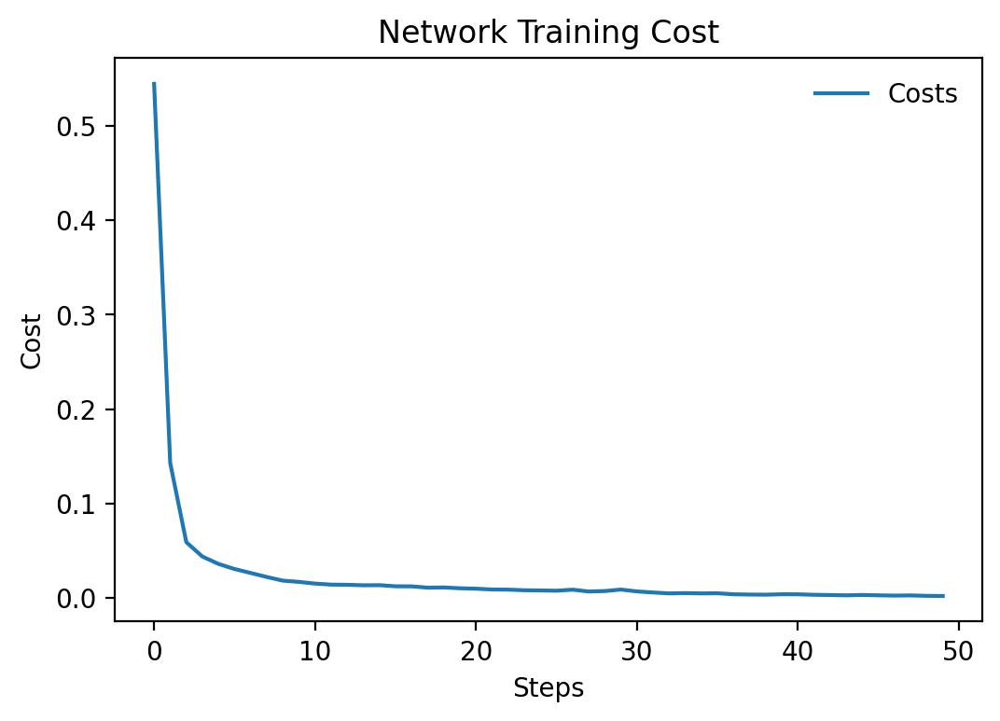

In [17]:
#Plot costs vs steps
fig,ax=plt.subplots()
ax.plot(np.arange(50),costs,label=r"Costs")
ax.set_xlabel("Steps")
ax.set_ylabel("Cost")
ax.set_title("Network Training Cost")
ax.legend()

print(f'Final Cost {costs[-1]}')

### Generate predictions
Given that the window size and offset are both 20, we are using batches of 20 data points to predict a data point 20 in the future. The predictions have been generated using the modelPreds function below, for each of the coordinates.

In [18]:
# Get the model predictions on test array
x1_pred, y1_pred, x2_pred, y2_pred = modelPreds(model, test_inputs, windowsize=20)

### 2. Plotting Network Predictions

**How stable is your network to variations in initial conditions? Make a plot of x and y vs time to show the network prediction in comparison to the solution from solve_ivp**

The plot of x and y is shown below, along with comparisons to the solution from solve_ivp. It can be observed that for pendulum 1, the shape is generally ok, however there is larger variation in the y values, with the pendulum not reaching the same peaks as predicted in the solve_ivp values. 

For the second pendulum, there is a similar story, with the y values having a bigger range especially near the equilibrium displacement of the pendulum.


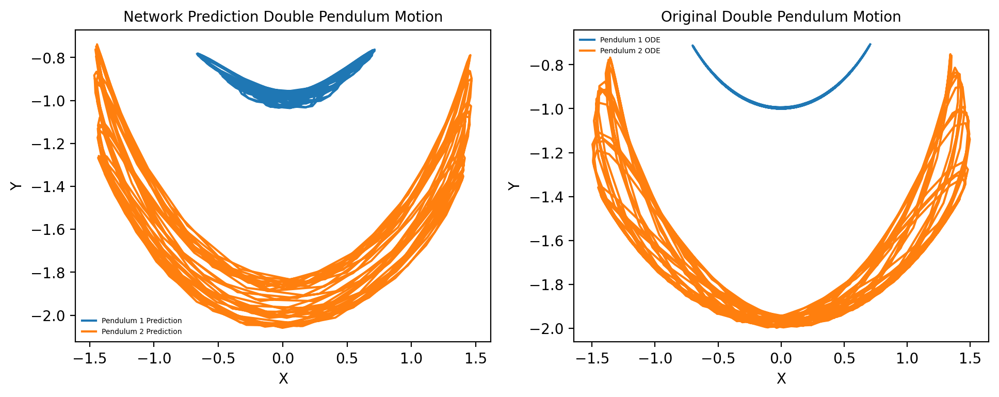

In [19]:
# Plot the model predictions
plt.subplot(1,2,1)
plt.subplots_adjust(right=1.6)
plt.title('Network Prediction Double Pendulum Motion', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.plot(x1_pred, y1_pred, label='Pendulum 1 Prediction')
plt.plot(x2_pred, y2_pred, label='Pendulum 2 Prediction')
plt.legend(fontsize=5)

# Plot the original motion
plt.subplot(1,2,2)
plt.title('Original Double Pendulum Motion', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.plot(x1_test_input, y1_test_input, label='Pendulum 1 ODE')
plt.plot(x2_test_input, y2_test_input, label='Pendulum 2 ODE')
plt.legend(fontsize=5)

**Plotting X and Y against time t.**

plotVsTime will take the predicted values and the test label values together for easy comparison.

In [20]:
def plotVsTime(x1_pred, y1_pred, x2_pred, y2_pred, x1_test_label, y1_test_label, x2_test_label, y2_test_label):

  # Plotting
  fig, axs = plt.subplots(2, 2, figsize=(10, 10))

  axs[0, 0].set_title('x1 vs Time')
  axs[0, 0].plot(t[:len(x1_pred)], x1_pred, label='Prediction')
  axs[0, 0].plot(t[:(len(x1_test_label))], x1_test_label, label='Actual')
  axs[0, 0].set_ylabel('X')
  axs[0, 0].set_xlabel('Time (t)')
  axs[0, 0].legend()

  # Plotting
  axs[0, 1].set_title('y1 vs Time')
  axs[0, 1].plot(t[:len(y1_pred)], y1_pred, label='Prediction')
  axs[0, 1].plot(t[:(len(y1_test_label))], y1_test_label, label='Actual')
  axs[0, 1].set_ylabel('Y')
  axs[0, 1].set_xlabel('Time (t)')
  axs[0, 1].legend()

  # Plotting
  axs[1, 0].set_title('x2 vs Time')
  axs[1, 0].plot(t[:len(x2_pred)], x2_pred, label='Prediction')
  axs[1, 0].plot(t[:(len(x2_test_label))], x2_test_label, label='Actual')
  axs[1, 0].set_ylabel('X')
  axs[1, 0].set_xlabel('Time (t)')
  axs[1, 0].legend()

  # Plotting
  axs[1, 1].set_title('y2 vs Time')
  axs[1, 1].plot(t[:len(y2_pred)], y2_pred, label='Prediction')
  axs[1, 1].plot(t[:(len(y2_test_label))], y2_test_label, label='Actual')
  axs[1, 1].set_ylabel('Y')
  axs[1, 1].set_xlabel('Time (t)')
  axs[1, 1].legend()

  plt.show()

  return None

**X and Y against time for $z_0=[\pi/4,0,\pi/4,0]$**

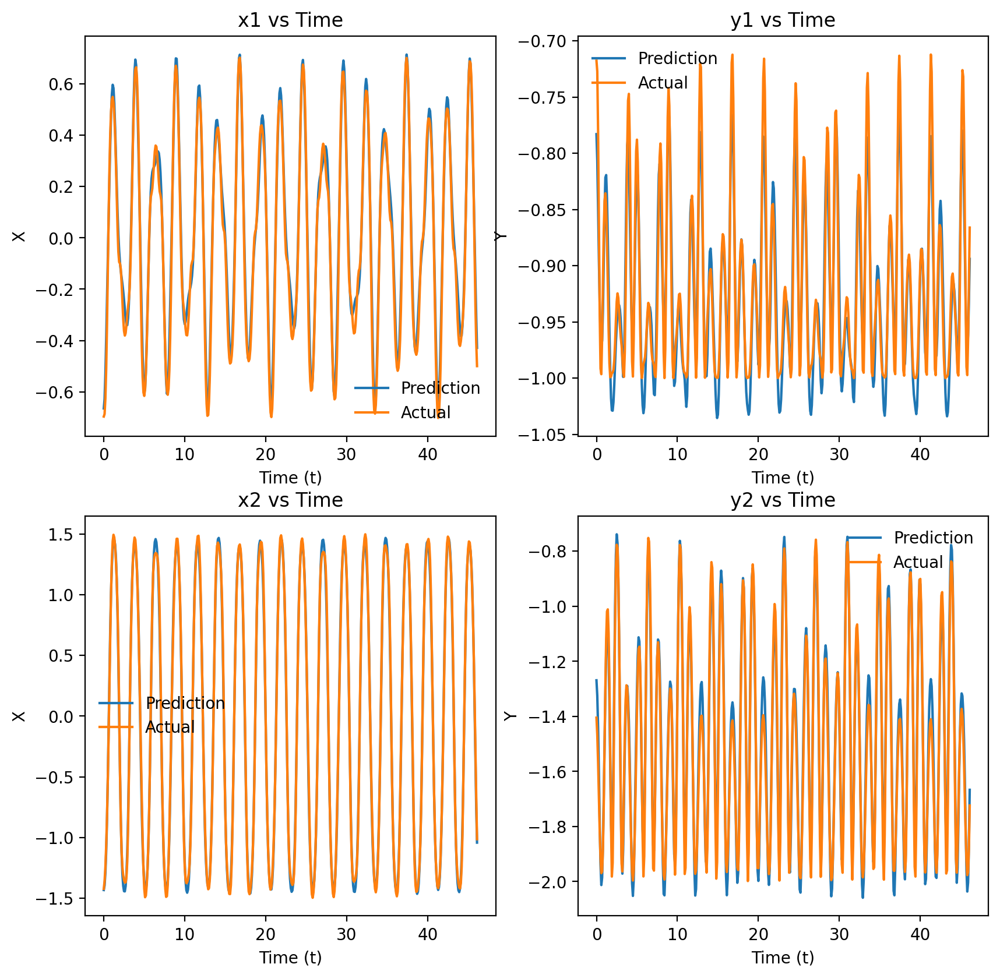

In [21]:
# For the original initial conditions
plotVsTime(x1_pred, y1_pred, x2_pred, y2_pred, x1_test_label, y1_test_label, x2_test_label, y2_test_label)

**Observations**

The predicted values for x1 and x2 show quite small deviations from the test labels, indicating the model is quite a good fit in the x direction for both pendulums. 

For the predicted values of y1 and y2, there is slightly more deviation from the test labels, especially in magnitude of the y-values. However, the shape remains almost the same.

Therefore the x-coords seem to have been predicted slightly better, but overall the model shows a good fit.

**Varying z0 Initial Conditions**

varyz0 allows for easy variation in the initial z0 values, to gauge the performance of a given model on different initial z0 conditions.

For instance, first we will use this function to see the how the model that was trained on $z_0=[\pi/4,0,\pi/4,0]$ initial conditions performs when given predicting the motion of $z_0=[\pi/2,0,\pi/2,0]$ initial conditions.

In [22]:
def varyz0(z0, model):

  '''
  Function that allows changing of the initial conditions
  Inputs: z0, model
  Outputs: x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred
  '''

  #Time ranges
  tmax, dt = 50, 0.1
  t = np.arange(0, tmax+dt, dt)

  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  train_input, train_label, test_input, test_label = getTestTrain(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

  x1_test_label = test_label[:,0]
  y1_test_label = test_label[:,1]
  x2_test_label = test_label[:,2]
  y2_test_label = test_label[:,3]

  # Get model predictions
  x1_pred, y1_pred, x2_pred, y2_pred = modelPreds(model, test_input, windowsize=20)

  return x1_test_label, y1_test_label, x2_test_label, y2_test_label, x1_pred, y1_pred, x2_pred, y2_pred

**z0 Values**

The following z0 values will be tested: 
- $z_0=[\pi/4,0,\pi/4,0]$
- $z_0=[\pi/2,0,\pi/2,0]$
- $z_0= [\pi,0,\pi,0] $

Below, the networks prediction will be plotted alongside the solver calculated motion.

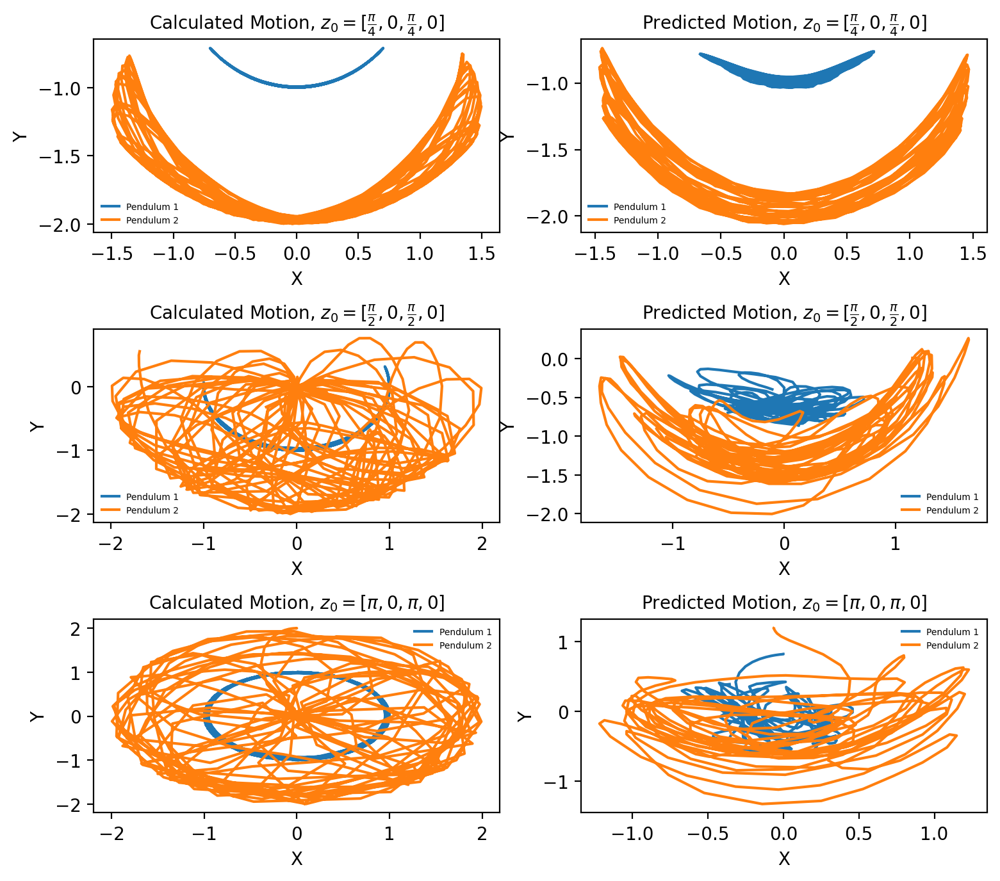

In [23]:
# A range of different initial conditions
z0_1 = [np.pi/4,0,np.pi/4,0]
z0_2 = [np.pi/2,0,np.pi/2,0]
z0_3 = [np.pi,0,np.pi,0]

# Generate x and y values for each pendulum
x1_1, y1_1, x2_1, y2_1, x1_pred_1, y1_pred_1, x2_pred_1, y2_pred_1 = varyz0(z0_1, model)
x1_2, y1_2, x2_2, y2_2, x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2 = varyz0(z0_2, model)
x1_3, y1_3, x2_3, y2_3, x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3 = varyz0(z0_3, model)

# Create a figure with 2 rows and 3 columns of subplots
plt.subplots(nrows=2, ncols=3, figsize=(9, 8))

# Plot the solved version
plt.subplot(3, 2, 1)
plt.subplots_adjust(hspace=0.5, wspace=0.2)
plt.title(r'Calculated Motion, $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$', fontsize=10)
plt.plot(x1_1, y1_1, label='Pendulum 1')
plt.plot(x2_1, y2_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 2)
plt.title(r'Predicted Motion, $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$', fontsize=10)
plt.plot(x1_pred_1, y1_pred_1, label='Pendulum 1')
plt.plot(x2_pred_1, y2_pred_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 3)
plt.title(r'Calculated Motion, $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$', fontsize=10)
plt.plot(x1_2, y1_2, label='Pendulum 1')
plt.plot(x2_2, y2_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 4)
plt.title(r'Predicted Motion, $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$', fontsize=10)
plt.plot(x1_pred_2, y1_pred_2, label='Pendulum 1')
plt.plot(x2_pred_2, y2_pred_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 5)
plt.title(r'Calculated Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_3, y1_3, label='Pendulum 1')
plt.plot(x2_3, y2_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 6)
plt.title('Predicted Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_pred_3, y1_pred_3, label='Pendulum 1')
plt.plot(x2_pred_3, y2_pred_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

**Observations**

For $z_0=[\pi/2,0,\pi/2,0]$:

The model prediction appears to be quite far off the calculated motion. Especially for pendulum 1, which does not follow the clear, stable harmonic motion as calculated. There is a similar story with pendulum 2, where it does not seem to 'flip over' as shown in the calculated version.

$z_0=[\pi,0,\pi,0]$

The model's prediction seems very far off, with no complete circular loops shown by each pendulum.

**Plot vs Time for $z_0=[\pi/2,0,\pi/2,0]$**

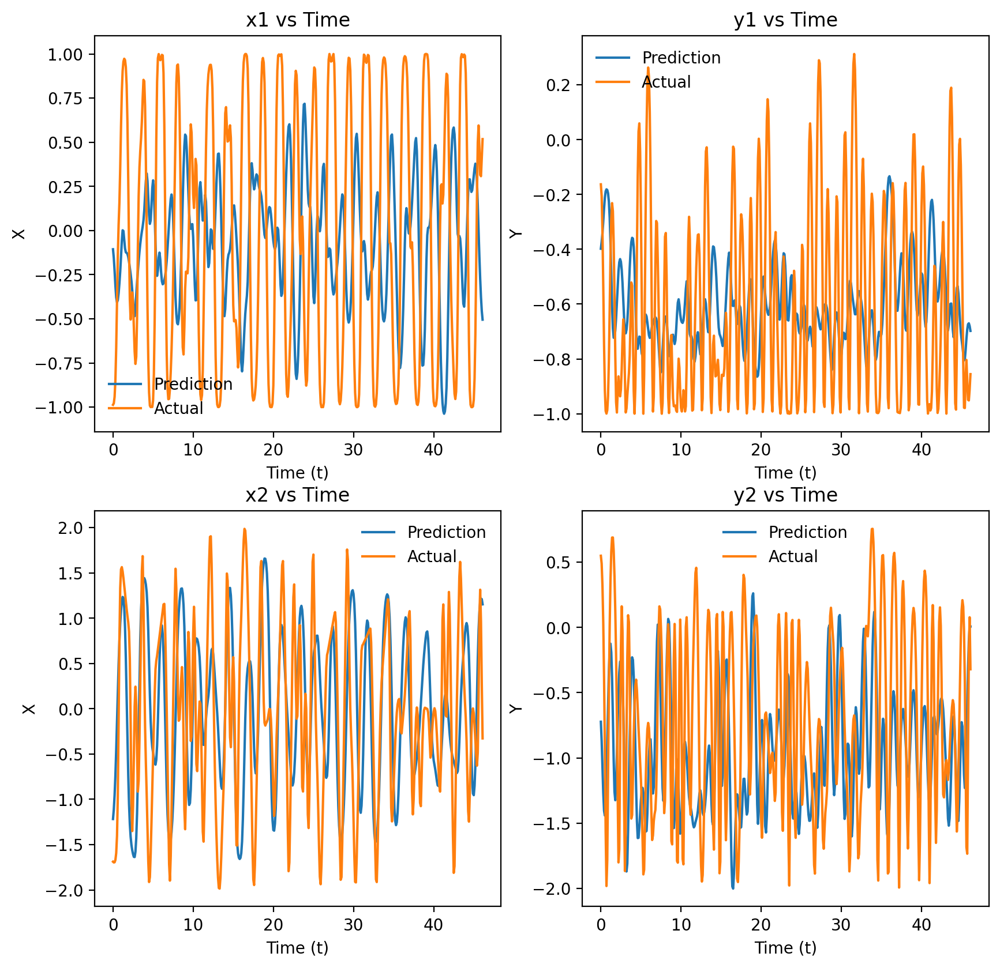

In [24]:
plotVsTime(x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2, x1_2, y1_2, x2_2, y2_2)

**Observations for $z_0=[\pi/2,0,\pi/2,0]$**

Looking at the above plots of x and y  against time, a general trend that we can observe is that the actual (test label) values are consistently of higher magnitude that the predicted values.

**Plot vs Time for $z_0=[\pi,0,\pi,0]$**

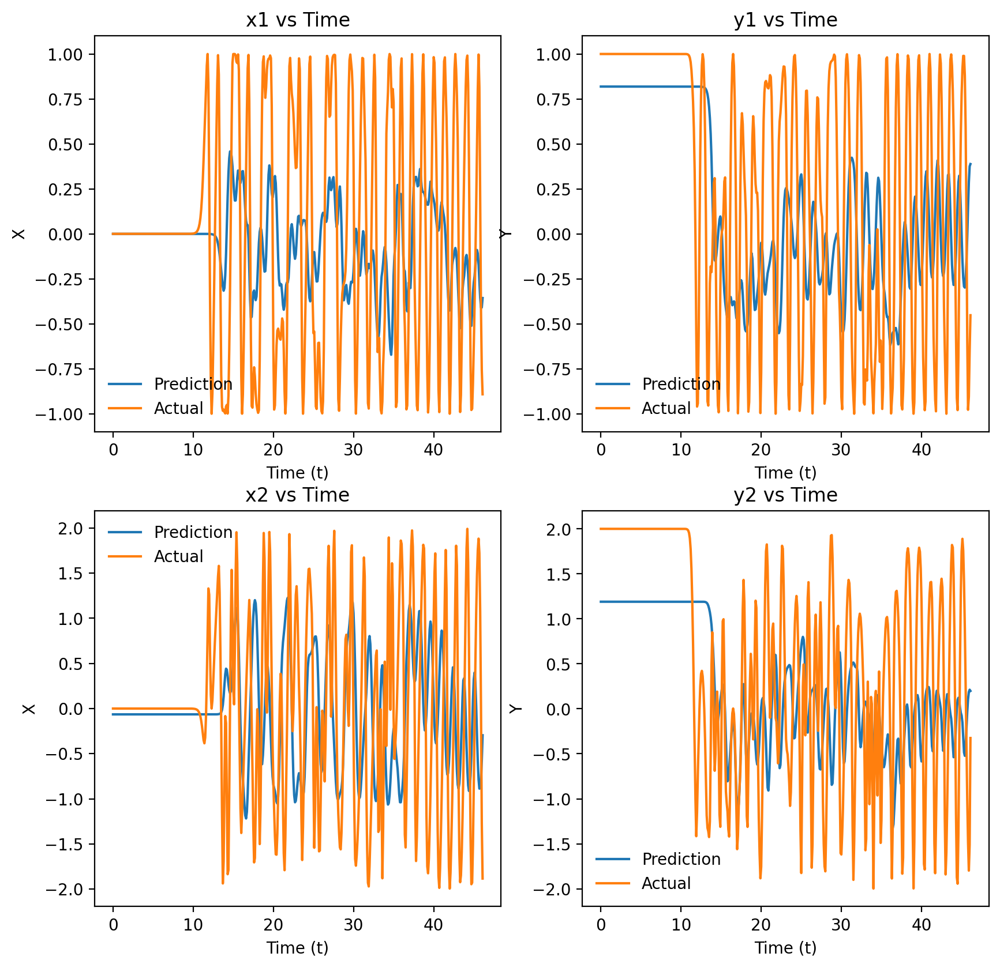

In [25]:
plotVsTime(x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3, x1_3, y1_3, x2_3, y2_3)

**Observations for $z_0=[\pi,0,\pi,0]$**

Once again, the actual values are higher magnitude compared to the predicted values. Also it appears more noisy, with fewer of the peaks on prediction corresponding to the peaks on the actual data.

**Overall Observations**

Overall, it seems that the model trained on one set of initial conditions does not generalise very well to different sets of initial conditions!



### 3. Future Predictions

**How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from t=t0+20δt to t=t0+100δt (e.g. for each extrapolation time, train a new version of the network and then plot the performance)**

To vary the extrapolation time, we can change our 'offset' parameter. Since the offset is essentially the distance between the end of our training data and the point we wish to predict, changing this to 100 would mean we want to predict a point 100 points further into the future.

In [26]:
# First reset initial z0
z0=[np.pi/4,0,np.pi/4,0]

#### Deviations

There are many values that can be used as a measure of the deviation, though they all stem from the same principle. Some of these include:

- Mean Squared Error (MSE)
- Mean Absolute Error (MAE)
- Root Mean Squared Error (RMSE)
- R-Squared (R2)

All of these involve getting the squared differences between expected and predicted values, so will all show the same shape (or very close) when plotted.

In [27]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

In [28]:
def getDeviations(no_of_offsets=5, z0=[np.pi/4,0,np.pi/4,0]):
  '''
  Function to get a range of different deviation metrics for a model and initial conditions
  Inputs: no_of_offsets, z0
  Outputs: preds, deviation metrics
  '''

  # Generate some offsets to test
  test_offsets = np.linspace(20,100, no_of_offsets).astype(int)

  # Initialise
  test_loss_arr = []
  mse_arr = []
  mae_arr = []
  rmse_arr = []
  r2_arr = []

  # Loop through test offsets
  for test_offset in test_offsets:

    # Generate test array
    #testarr, testlabs = getInputsLabels(windowsize=20, offset=test_offset, z0=z0)
    train_input, train_label, test_input, test_label = getTestTrain(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

    # Update
    print('--------------------------------------------')
    print(f'TEST OFFSET: {test_offset}' )
    print('--------------------------------------------')

    # Train new model
    model, costs, steps = generateAndTrain(train_input, train_label, neurons=32, steps=32, verbose=0)

    # Loss
    test_loss = model.evaluate(test_input, test_label, verbose=1)

    # Generate predictions
    preds = modelPreds(model, test_input, windowsize=20, single=True)

    # Deviations  
    mse = mean_squared_error(preds, test_label)
    mae = mean_absolute_error(preds,test_label)
    rmse = np.sqrt(mse)
    r2 = r2_score(preds, test_label)

    # Put in an array
    mse_arr.append(mse)
    mae_arr.append(mae)
    rmse_arr.append(rmse)
    r2_arr.append(r2)

    test_loss_arr.append(test_loss)

  return preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr
  #return x1devs, y1devs, x2devs, y2devs, costs_arr, test_loss_arr


In [29]:
# Set number of values to cycle through
no_of_offsets=10
test_offsets = np.linspace(20,100, no_of_offsets).astype(int)

In [30]:
# Get our deviations
preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr  = getDeviations(no_of_offsets=no_of_offsets,z0=[np.pi/4,0,np.pi/4,0])

--------------------------------------------
TEST OFFSET: 20
--------------------------------------------
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 32)                4736      
                                                                 
 dense_1 (Dense)             (None, 4)                 132       
                                                                 
Total params: 4,868
Trainable params: 4,868
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 4ms/step - loss: 0.0114
--------------------------------------------
TEST OFFSET: 28
--------------------------------------------
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)

--------------------------------------------
TEST OFFSET: 55
--------------------------------------------
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 32)                4736      
                                                                 
 dense_5 (Dense)             (None, 4)                 132       
                                                                 
Total params: 4,868
Trainable params: 4,868
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 4ms/step - loss: 0.0112


--------------------------------------------
TEST OFFSET: 64
--------------------------------------------
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 32)                4736      
                                                                 
 dense_6 (Dense)             (None, 4)                 132       
                                                                 
Total params: 4,868
Trainable params: 4,868
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 4ms/step - loss: 0.0106
--------------------------------------------
TEST OFFSET: 73
--------------------------------------------
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)

**Plotting Deviations**

We now plot our metrics for deviation, the test loss (essentially the mean-square error) and the mean absolute error (MAE). Both are quite similar, so the plots therefore look very similar.

**MSE**

Mean squared error (MSE) measures the average squared difference between the predicted and actual values and is used often for LSTMs. In the context of LSTM, MSE measures the quality of the model in predicting future values based on the past values. A lower MSE value indicates that the model is better at making predictions.

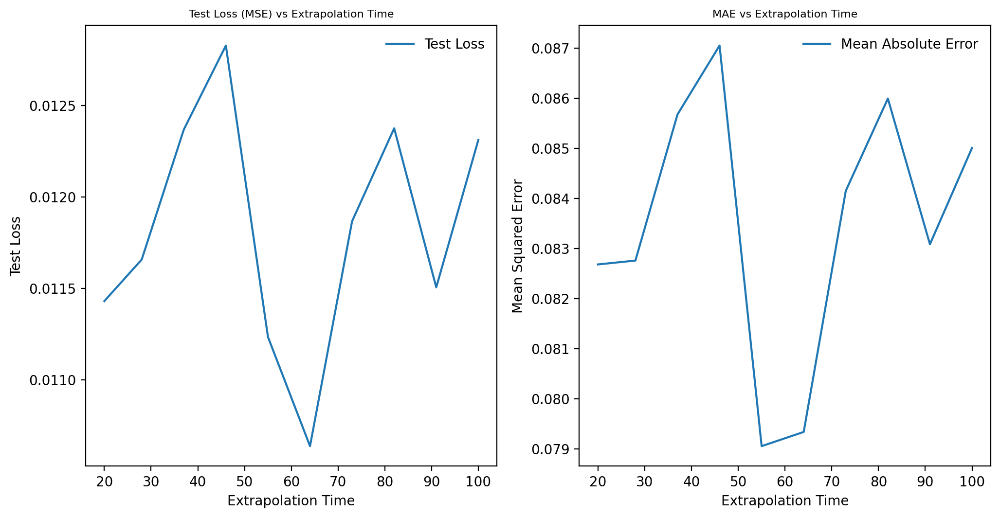

In [31]:
# Plotting
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
fig.subplots_adjust(wspace=0.2)

# Test Loss
axs[0].set_title("Test Loss (MSE) vs Extrapolation Time", fontsize=8)
axs[0].plot(test_offsets, test_loss_arr, label='Test Loss')
axs[0].set_xlabel('Extrapolation Time')
axs[0].set_ylabel('Test Loss')
axs[0].legend()

# MAE
axs[1].set_title("MAE vs Extrapolation Time", fontsize=8)
axs[1].plot(test_offsets, mae_arr, label='Mean Absolute Error')
axs[1].set_xlabel('Extrapolation Time')
axs[1].set_ylabel('Mean Squared Error')
axs[1].legend()

**Observations**

Both plots show the same information. From the plot we can see the lowest test loss and mean square error both occur in the region of 40-50 extrapolation time (offset) - approximately 46. This may suggest 40-50 extrapolation time is ideal to minimise our overall deviation in predictions.

Though it is also important to note that the plot looks quite erratic, with no clear trend available to see. Therefore, I don't think it is advisable to make the above mentioned conclusion in this case, and perhaps further data points should be tested.

### 4. Vary Initial Conditions
Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.

In [32]:
#Starting angles
z0new=[np.pi/2,0,np.pi/2,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

Below we define varyAndTrainz0 which will allow varying of initial conditions and completes training the model and generating predictions.

In [33]:
def varyAndTrainz0(z0):

  '''
  Function that allows changing of the initial conditions
  Inputs: z0, model
  Outputs: x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred
  '''

  #Time ranges
  tmax, dt = 50, 0.1
  t = np.arange(0, tmax+dt, dt)

  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Get train and test set
  train_input, train_label, test_input, test_label = getTestTrain(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

  # Generate and train
  model, costs, steps = generateAndTrain(train_input, train_label, neurons=128, steps=50)

  # Get model predictions
  x1_pred, y1_pred, x2_pred, y2_pred = modelPreds(model, test_input, windowsize=20)

  # Separate
  x1_test = test_input[:,0][:,0]
  y1_test = test_input[:,0][:,1]
  x2_test = test_input[:,0][:,2]
  y2_test = test_input[:,0][:,3]

  return x1_test, y1_test, x2_test, y2_test, x1_pred, y1_pred, x2_pred, y2_pred, costs, steps, test_label, model

In [34]:
x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred, costs, steps, test_label, model = varyAndTrainz0(z0new)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 128)               68096     
                                                                 
 dense_11 (Dense)            (None, 4)                 516       
                                                                 
Total params: 68,612
Trainable params: 68,612
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
9/9 [==============================] - 3s 35ms/step - loss: 0.5871
Epoch 2/50
9/9 [==============================] - 0s 30ms/step - loss: 0.4379
Epoch 3/50
9/9 [==============================] - 0s 45ms/step - loss: 0.3954
Epoch 4/50
9/9 [==============================] - 1s 56ms/step - loss: 0.3831
Epoch 5/50
9/9 [==============================] - 1s 57ms/step - loss: 0.3714
Epoch 6/50
9/9 [==============================] - 1s 60

**Plot against calculated motion**

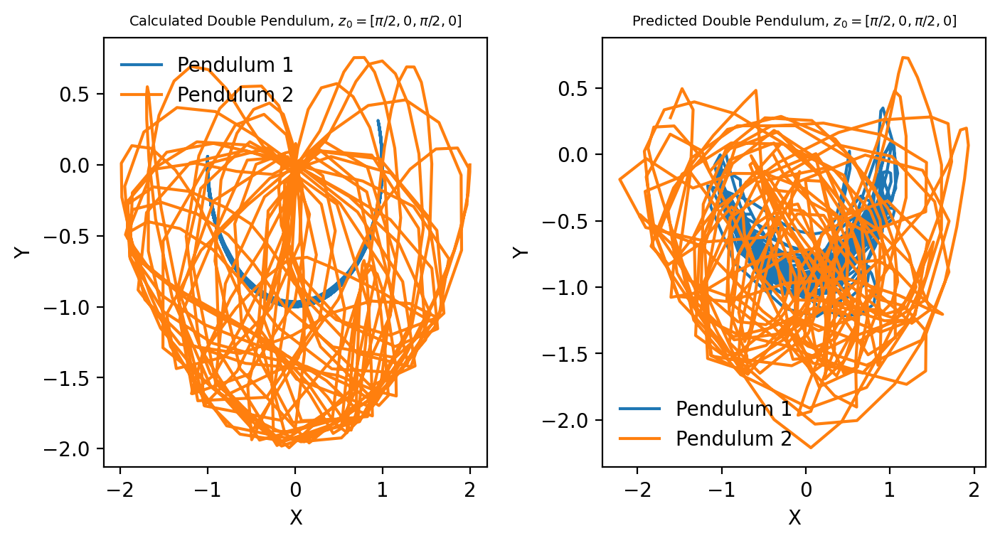

In [35]:
# Create a figure with 2 rows and 2 columns of subplots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Create two subplots side by side
axs[0].set_title(r'Calculated Double Pendulum, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=7)
axs[0].plot(x1,y1, label='Pendulum 1')
axs[0].plot(x2, y2, label='Pendulum 2')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].legend()

axs[1].set_title(r'Predicted Double Pendulum, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=7)
axs[1].plot(x1_pred, y1_pred, label='Pendulum 1')
axs[1].plot(x2_pred, y2_pred, label='Pendulum 2')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].legend()


# Add more space between the subplots
plt.subplots_adjust(wspace=0.3)

plt.show()

**Observation**

The model appears to predict the motion quite well. Comparing this to the previous model trained on the initial z0 value, there is definitely an improvement in accuracy.

In [36]:
# Split into test labels
x1_test_label = test_label[:,0]
y1_test_label = test_label[:,1]
x2_test_label = test_label[:,2]
y2_test_label = test_label[:,3]

**Plot vs time for $z_0 = [π/2, 0, π/2, 0]$**


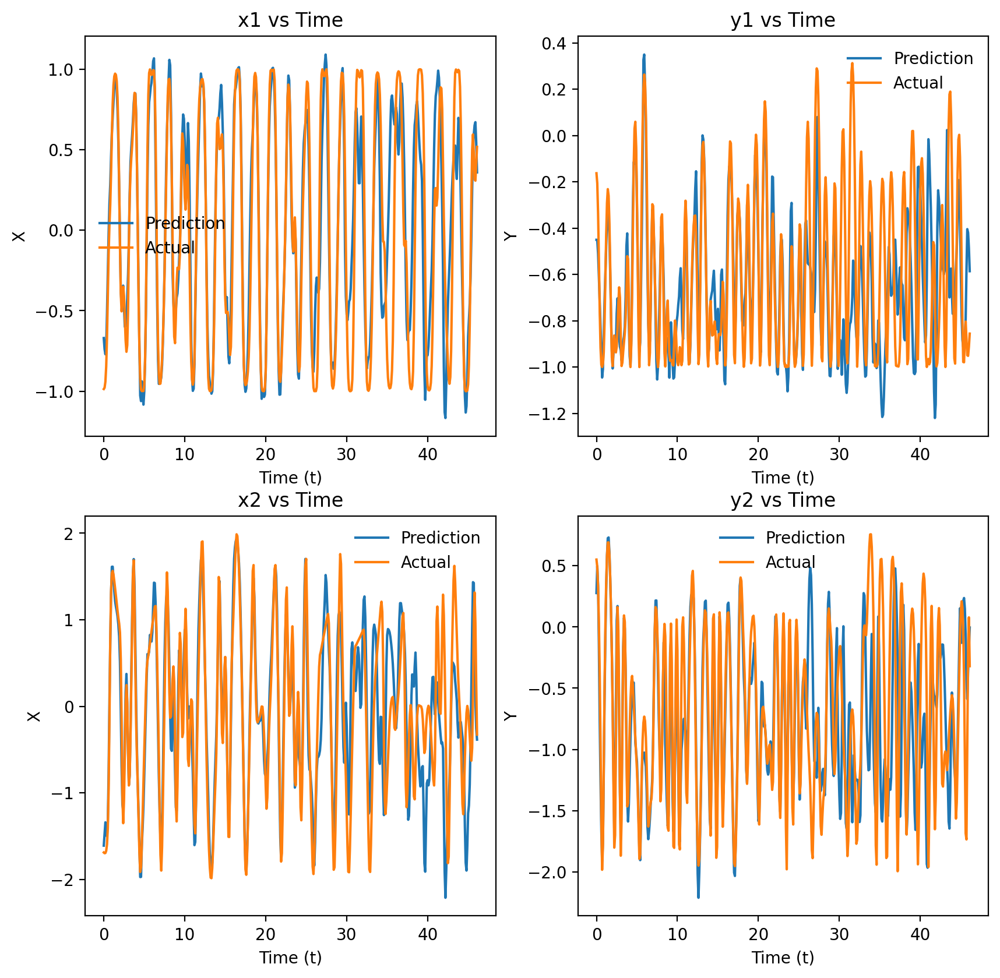

In [37]:
plotVsTime(x1_pred, y1_pred, x2_pred, y2_pred, x1_test_label, y1_test_label, x2_test_label, y2_test_label)

**Observation**

The model predictions follow the actual values quite well.

**Testing the model on different initial z0**

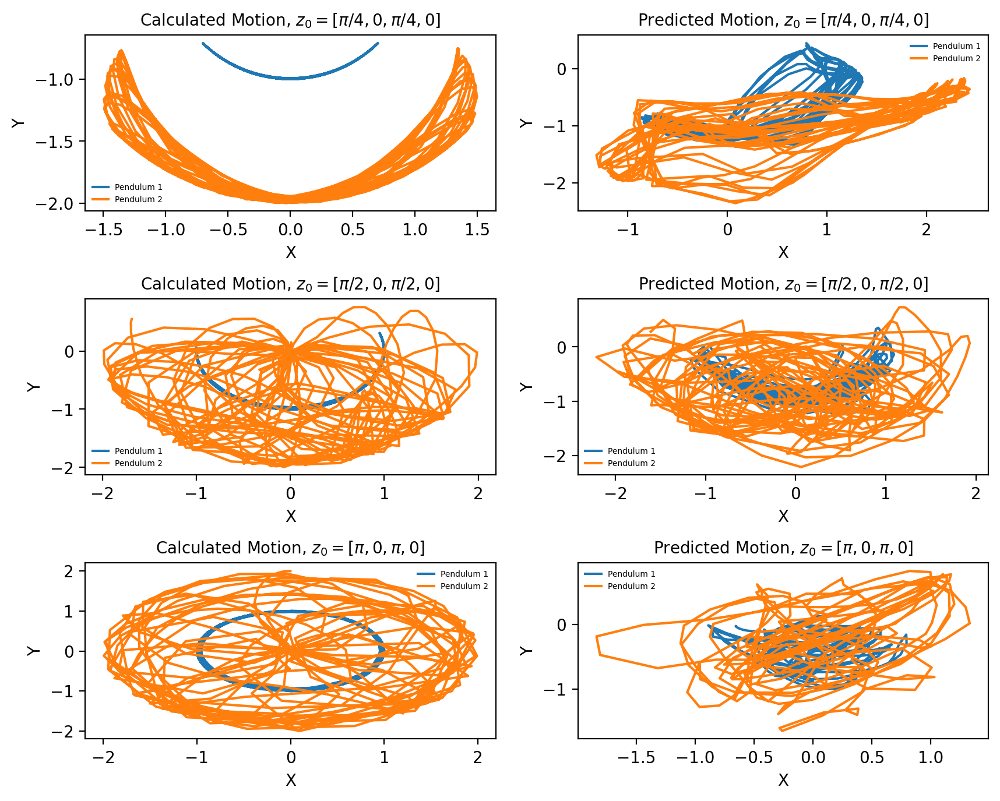

In [38]:
# A range of different initial conditions
z0_1 = [np.pi/4,0,np.pi/4,0]
z0_2 = [np.pi/2,0,np.pi/2,0]
z0_3 = [np.pi,0,np.pi,0]

# Generate x and y values for each pendulum
x1_1, y1_1, x2_1, y2_1, x1_pred_1, y1_pred_1, x2_pred_1, y2_pred_1 = varyz0(z0_1, model)
x1_2, y1_2, x2_2, y2_2, x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2 = varyz0(z0_2, model)
x1_3, y1_3, x2_3, y2_3, x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3 = varyz0(z0_3, model)

# Create a figure with 2 rows and 3 columns of subplots
plt.subplots(nrows=2, ncols=3, figsize=(10, 8))

# Plot the solved version
plt.subplot(3, 2, 1)
plt.subplots_adjust(hspace=0.5, wspace=0.2)
plt.title(r'Calculated Motion, $z_0 = [\pi/4, 0, \pi/4, 0]$', fontsize=10)
plt.plot(x1_1, y1_1, label='Pendulum 1')
plt.plot(x2_1, y2_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 2)
plt.title(r'Predicted Motion, $z_0 = [\pi/4, 0, \pi/4, 0]$', fontsize=10)
plt.plot(x1_pred_1, y1_pred_1, label='Pendulum 1')
plt.plot(x2_pred_1, y2_pred_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 3)
plt.title(r'Calculated Motion, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=10)
plt.plot(x1_2, y1_2, label='Pendulum 1')
plt.plot(x2_2, y2_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 4)
plt.title(r'Predicted Motion, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=10)
plt.plot(x1_pred_2, y1_pred_2, label='Pendulum 1')
plt.plot(x2_pred_2, y2_pred_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 5)
plt.title(r'Calculated Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_3, y1_3, label='Pendulum 1')
plt.plot(x2_3, y2_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 6)
plt.title(r'Predicted Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_pred_3, y1_pred_3, label='Pendulum 1')
plt.plot(x2_pred_3, y2_pred_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

**Observation**

For $z_0 = [π/4, 0, π/4, 0]$:

The model prediction in this case was very different from the expected calculated value. The shape of motion was completely different.

For $z_0 = [π/2, 0, π/2, 0]$:

In this case, the model prediction was fairly close, and generally followed the calculated motion overall.

$z_0 = [\pi, 0, \pi, 0]$:

The motion was somewhat accurate, but overall it was not a very good prediction when compared to the calculated motion

**Overall**

Overall, it appears that the model must be trained on the same initial conditions that it is going to be used to predict to get a reasonable accuracy of predictions. The models we have trained so far do not seem to be generalisable, at least not to an adequate level. 

It is also important to note that the trade-off between generalisability and accuracy is quite severe in this case.

**Plots vs Time**


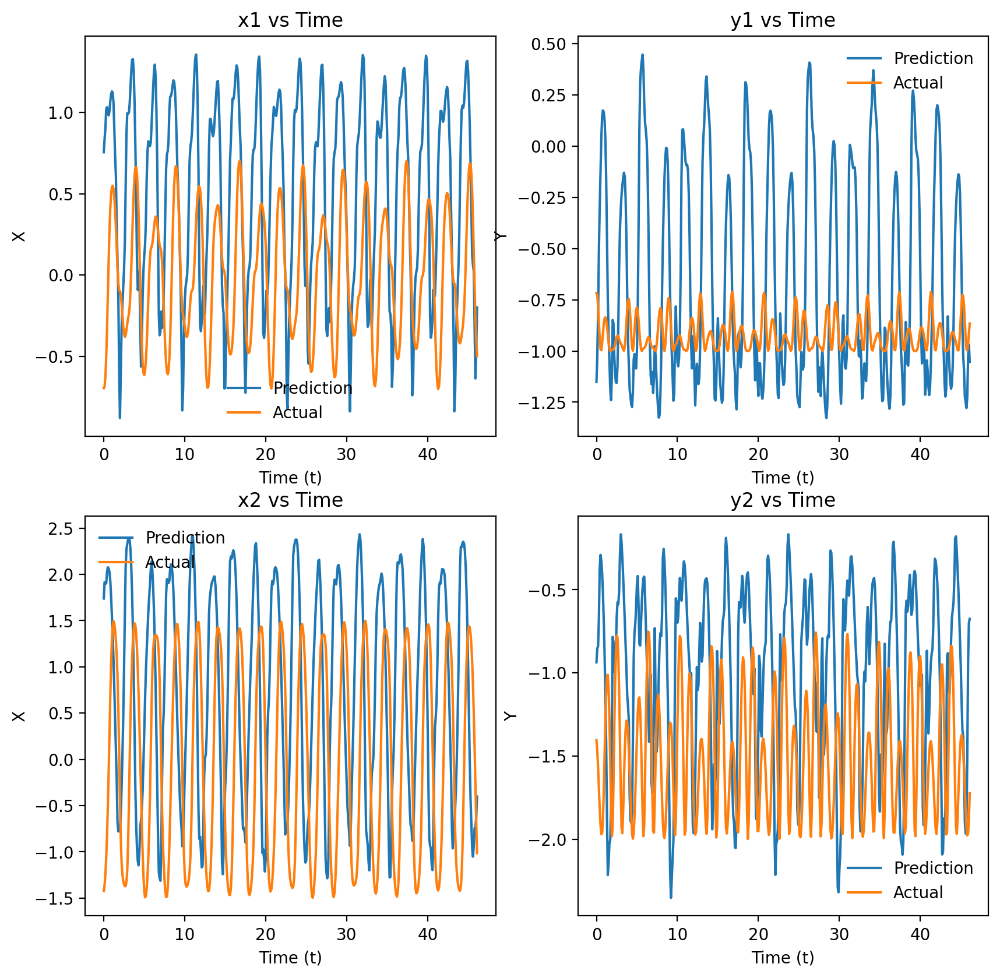

In [39]:
plotVsTime(x1_pred_1, y1_pred_1, x2_pred_1, y2_pred_1, x1_1, y1_1, x2_1, y2_1)

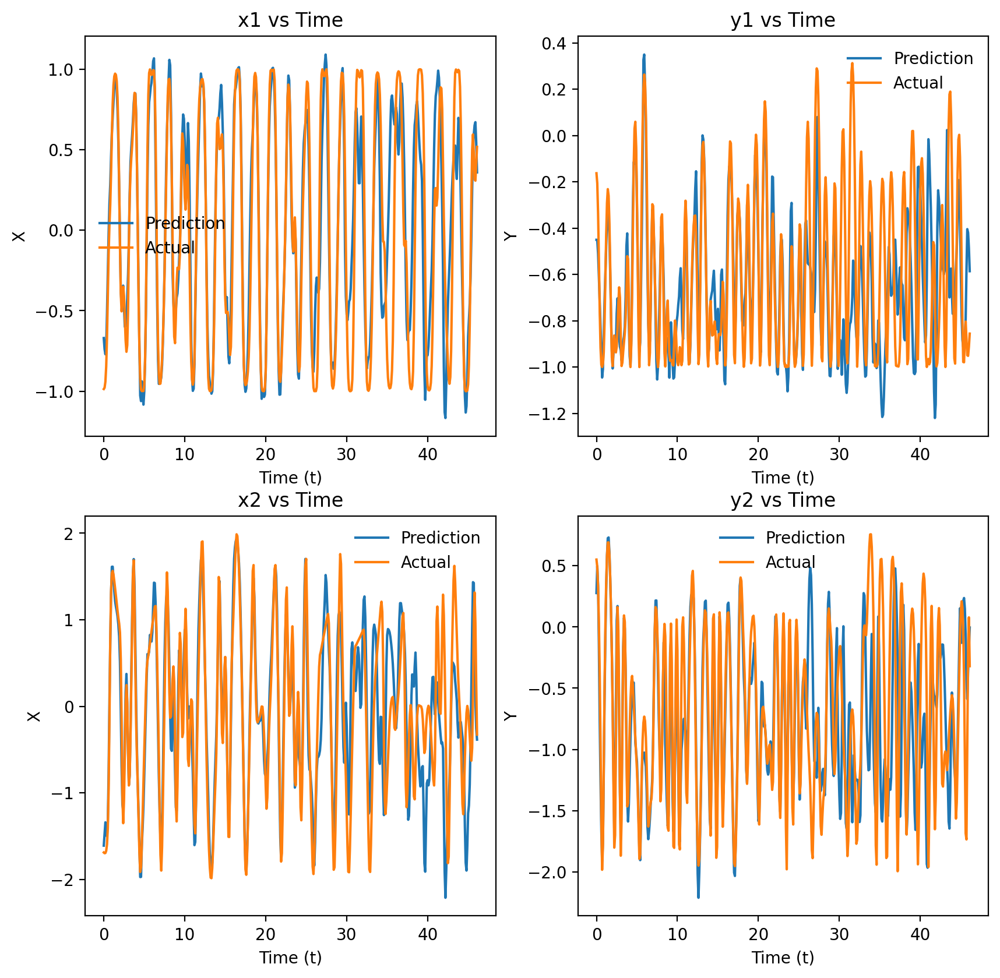

In [40]:
plotVsTime(x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2, x1_2, y1_2, x2_2, y2_2)

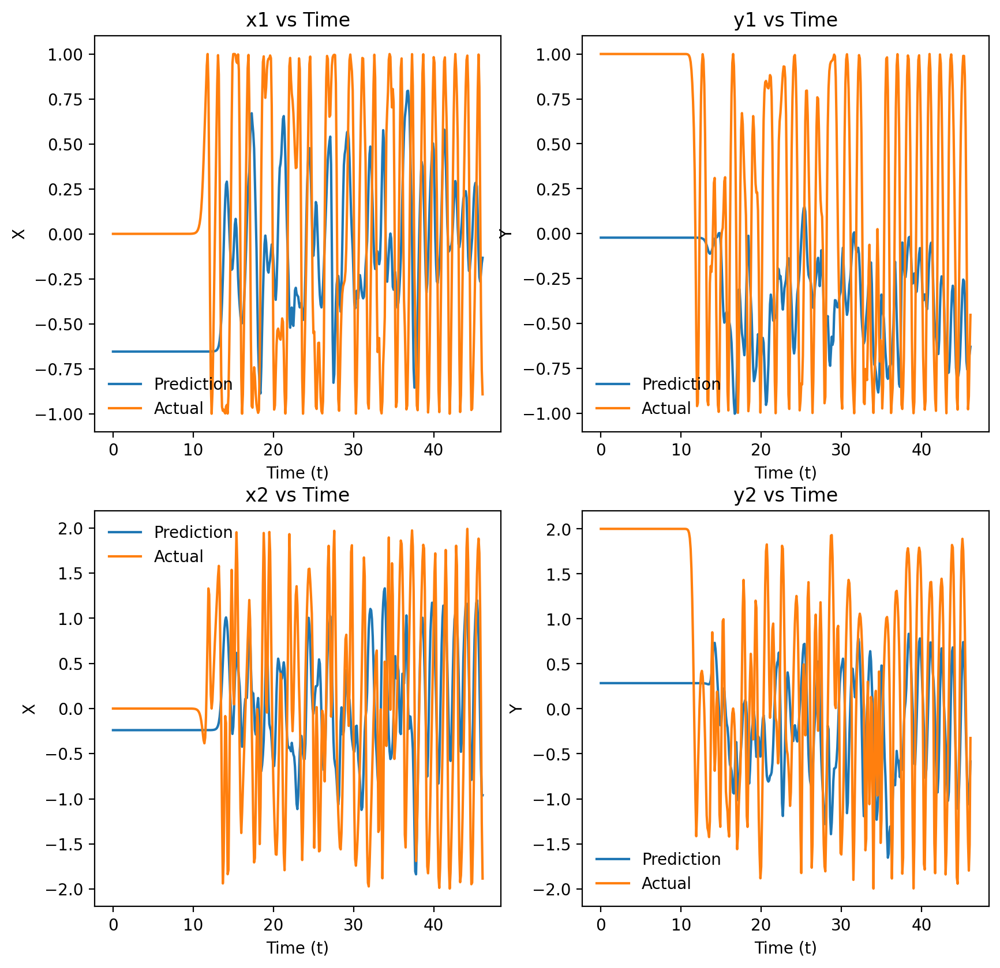

In [41]:
plotVsTime(x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3, x1_3, y1_3, x2_3, y2_3)

**Observations**

The above plots of x and y coordinates against time correspond with the previous plots of motion (plot of x and y) which has been plotted earlier. 

Overall, it appears that the model must be trained on the same initial conditions that it is going to be used to predict to get a reasonable accuracy of predictions. The models we have trained so far do not seem to be generalisable, at least not to an adequate level.

It is also important to note that the trade-off between generalisability and accuracy is quite severe in this case.

**Testing Extrapolation Times**

In [42]:
preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr  = getDeviations(no_of_offsets=no_of_offsets,z0=[np.pi/2,0,np.pi/2,0])

--------------------------------------------
TEST OFFSET: 20
--------------------------------------------
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 32)                4736      
                                                                 
 dense_12 (Dense)            (None, 4)                 132       
                                                                 
Total params: 4,868
Trainable params: 4,868
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 4ms/step - loss: 0.2738
--------------------------------------------
TEST OFFSET: 28
--------------------------------------------
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LS

**Plotting Deviation vs Extrapolation Time**


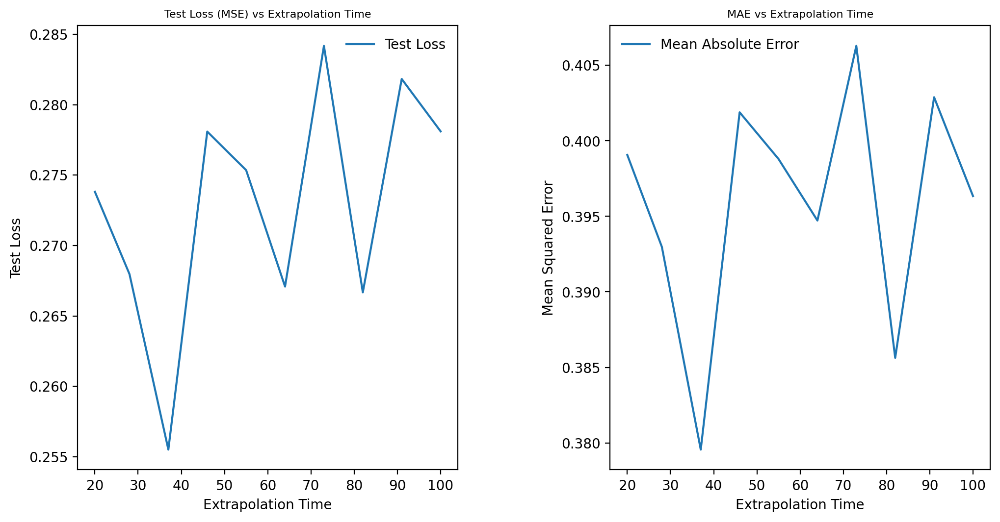

In [43]:
# Plotting
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
fig.subplots_adjust(wspace=0.4)

axs[0].set_title("Test Loss (MSE) vs Extrapolation Time", fontsize=8)
axs[0].plot(test_offsets, test_loss_arr, label='Test Loss')
axs[0].set_xlabel('Extrapolation Time')
axs[0].set_ylabel('Test Loss')
axs[0].legend()

axs[1].set_title("MAE vs Extrapolation Time", fontsize=8)
axs[1].plot(test_offsets, mae_arr, label='Mean Absolute Error')
axs[1].set_xlabel('Extrapolation Time')
axs[1].set_ylabel('Mean Squared Error')
axs[1].legend()

**Observations**

Loss:

The test loss appears to jump around a lot, with peaks at 20 and 80 extrapolation time. This suggests that the best extrapolation times may be at around 30-50s, however there is not really a clear trend in the plot to make a proper conclusion.

MAE: 

The same sort of trend is seen as the test loss (which is basically no trend).

**Conclusions**

We can conclude from this that the model network finds predicting values 20s in the future approximately just as hard as predicting values 90s or 100s in the future, so the predicting future positions problem does not get easier or harder when changing the time in the future you are predicting.

### 5. Training network on one mass

Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass m2 (i.e without showing your neural network the positions of the mass m1)

generateAndTrain has been altered for this task to generateAndTrain2, which does the same thing as before, but in this case the model has been adapted to take in two inputs, rather than 4, since in this case we want to train only on the positions of m2.

In [44]:
def generateAndTrain2(y_input, y_label, neurons=128, steps=50, verbose=1):
  
  '''
  Function to generate, compile and train our model. Returns the model, costs, steps.
  Inputs: y_input, y_label, neurons, steps
  Outputs: model, costs, steps
  '''

  #Define the RNN model
  model=keras.models.Sequential()
  model.add(keras.layers.LSTM(neurons,input_shape=(None,2),return_sequences=False)) 

  # 4 outputs corresponding 
  model.add(keras.layers.Dense(4,activation="linear"))
  model.compile(loss='mean_squared_error',optimizer='adam')
  model.summary()

  # Get the history
  history = model.fit(y_input, y_label, epochs=steps, verbose=verbose)

  # Loss
  costs = history.history['loss']

  return model, costs, steps

Again, we adapt getTestTrain as well, so now the function outputs two sets of training inputs (x2 and y2 - positions of m2 only). Though the number of sets of training labels need tor remain at 4, since we are still expecting 4 outputs.

In [45]:
def getTestTrain2(x1, y1, x2, y2, z0=[np.pi/4,0,np.pi/4,0], windowsize=20, offset=20):
  '''
  This function will generate a training and test dataset
  Inputs: x1, y1, x2, y2, z0, windowsizde, offset
  Outputs: train_inputs, train_labels, test_inputs, test_labels
  '''
  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Number of samples
  n_samples_1 = x1.shape[0]
  n_samples_2 = x2.shape[0]
  # Training set
  n_train_1 = int(0.6 * n_samples_1)
  n_train_2 = int(0.6 * n_samples_2)

  # Split the data into training and test sets
  x1_train, x1_test = x1[:n_train_1], x1#[n_train_1:]
  y1_train, y1_test = y1[:n_train_1], y1#[n_train_1:]
  x2_train, x2_test = x2[:n_train_2], x2#[n_train_2:]
  y2_train, y2_test = y2[:n_train_2], y2#[n_train_2:]

  # Arrange into correct shape
  x1_train_input, x1_train_label = shapeArray(x1_train, windowsize=windowsize, offset=offset)
  x2_train_input, x2_train_label = shapeArray(x2_train, windowsize=windowsize, offset=offset)
  y1_train_input, y1_train_label = shapeArray(y1_train, windowsize=windowsize, offset=offset)
  y2_train_input, y2_train_label = shapeArray(y2_train, windowsize=windowsize, offset=offset)

  # Put together in one array
  train_inputs = np.array([x2_train_input.T, y2_train_input.T]).T
  train_labels = np.array([x1_train_label.T, y1_train_label.T, x2_train_label.T, y2_train_label.T]).T

  # Arrange into correct shape
  x1_test_input, x1_test_label = shapeArray(x1_test, windowsize=windowsize, offset=offset)
  x2_test_input, x2_test_label = shapeArray(x2_test, windowsize=windowsize, offset=offset)
  y1_test_input, y1_test_label = shapeArray(y1_test, windowsize=windowsize, offset=offset)
  y2_test_input, y2_test_label = shapeArray(y2_test, windowsize=windowsize, offset=offset)

  # Put together in one array
  test_inputs = np.array([x2_test_input.T, y2_test_input.T]).T
  test_labels = np.array([x1_test_label.T, y1_test_label.T, x2_test_label.T, y2_test_label.T]).T

  # Train and Test Data
  return train_inputs, train_labels, test_inputs, test_labels

**Generate Training and Test Data**

In [46]:
# Get the training and test data
train_inputs2, train_labels2, test_inputs2, test_labels2 = getTestTrain2(x1, y1, x2, y2, z0=[np.pi/4,0,np.pi/4,0], windowsize=20, offset=20)

We can verify the shapes are correct.

In [47]:
print(train_inputs2.shape)
print(train_labels2.shape)
print(test_inputs2.shape)
print(test_labels2.shape)

# Separate test labels
x1_test_label2 = test_labels2[:,0]
y1_test_label2 = test_labels2[:,1]
x2_test_label2 = test_labels2[:,2]
y2_test_label2 = test_labels2[:,3]

(261, 20, 2)
(261, 4)
(462, 20, 2)
(462, 4)


It is as expected, the training data has sets, whilst the labels have 4.

**Model Training**

In [48]:
# Generate and train the model
model2, costs2, steps2 = generateAndTrain2(train_inputs2, train_labels2, neurons=128, steps=50, verbose=1)

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_22 (LSTM)              (None, 128)               67072     
                                                                 
 dense_22 (Dense)            (None, 4)                 516       
                                                                 
Total params: 67,588
Trainable params: 67,588
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
9/9 [==============================] - 4s 34ms/step - loss: 0.6793
Epoch 2/50
9/9 [==============================] - 0s 32ms/step - loss: 0.2032
Epoch 3/50
9/9 [==============================] - 0s 30ms/step - loss: 0.0684
Epoch 4/50
9/9 [==============================] - 0s 31ms/step - loss: 0.0510
Epoch 5/50
9/9 [==============================] - 0s 31ms/step - loss: 0.0362
Epoch 6/50
9/9 [==============================] - 0s 31

In [49]:
x1_pred2, y1_pred2, x2_pred2, y2_pred2 = modelPreds(model2, test_inputs2, windowsize=20, single=False, no_inputs=2)

**Plotting Predictions**

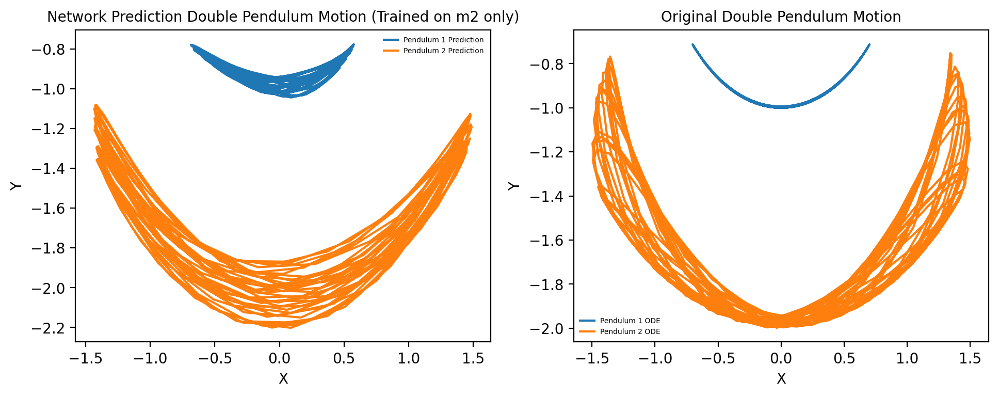

In [50]:
# Plot the model predictions
plt.subplot(1,2,1)
plt.subplots_adjust(right=1.6)
plt.title('Network Prediction Double Pendulum Motion (Trained on m2 only)', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.plot(x1_pred2, y1_pred2, label='Pendulum 1 Prediction')
plt.plot(x2_pred2, y2_pred2, label='Pendulum 2 Prediction')
plt.legend(fontsize=5)

# Plot the original motion
plt.subplot(1,2,2)
plt.title('Original Double Pendulum Motion', fontsize=10)
plt.xlabel('X')
plt.ylabel('Y')
plt.plot(x1_test_label2, y1_test_label2, label='Pendulum 1 ODE')
plt.plot(x2_test_label2, y2_test_label2, label='Pendulum 2 ODE')
plt.legend(fontsize=5)

**Plotting X and Y against time**

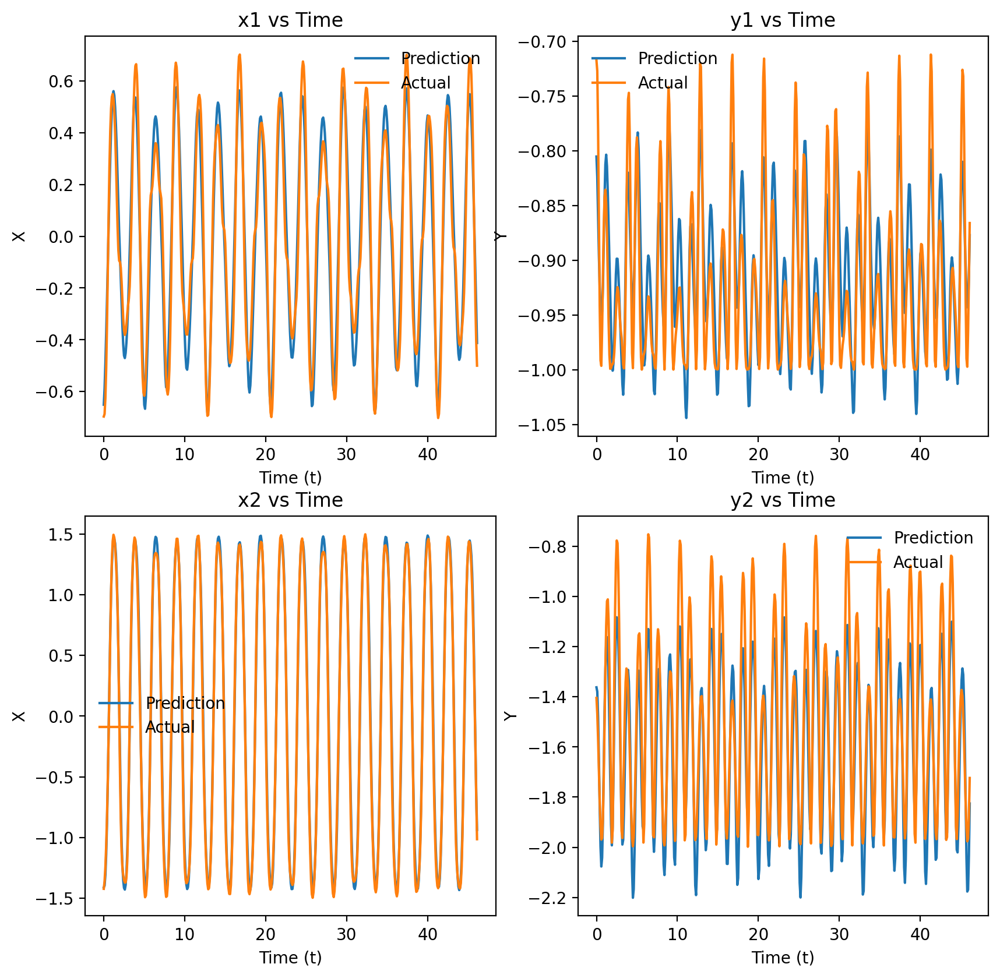

In [51]:
plotVsTime(x1_pred2, y1_pred2, x2_pred2, y2_pred2, x1_test_label2, y1_test_label2, x2_test_label2, y2_test_label2)

**Observations**

For x2 and y2:

The plots of x2 and y2 against time show very close agreement with the actual/expected plots. This suggests that the model predicts the motion of m2 quite well, which is as expected given that the model was trained on positions for m2. 

For x1 and y1:

The plots are generally in agreement when it comes to general motion, however there is a bit of noisiness, as the magnitudes of the coordinates are not completely in line or the same as the expected values. 

However, given that the model is trained only on m2 positins, this is not so bad of a prediction, though it is also quite clear that the model has taken m1's motion to be pretty much the same as m2's.

**Overall Conclusion** 

Overall, it appears that at least for the case of $z_0 = [π/4, 0, π/4, 0]$ initial condition, training the model on m2 positions only gives a fairly good prediction for both m1 and m2, but I believe this is mostly down to the fact that the motion of m1 and m2 look similar anyway in this case (which isn't always true, as we saw when varying the initial z0 conditions).

As usual, there is a trade off between prediction/model accuracy and generalisability.

**Varying z0 initial conditions**

Below we vary the z0 initial conditions and see the networks performance, as before.

In [52]:
def varyz02(z0, model):

  '''
  Function that allows changing of the initial conditions
  Inputs: z0, model
  Outputs: x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred
  '''

  #Time ranges
  tmax, dt = 50, 0.1
  t = np.arange(0, tmax+dt, dt)

  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  train_input, train_label, test_input, test_label = getTestTrain2(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

  x1_test_label = test_label[:,0]
  y1_test_label = test_label[:,1]
  x2_test_label = test_label[:,2]
  y2_test_label = test_label[:,3]

  # Get model predictions
  x1_pred, y1_pred, x2_pred, y2_pred = modelPreds(model, test_input, windowsize=20, no_inputs=2)

  return x1_test_label, y1_test_label, x2_test_label, y2_test_label, x1_pred, y1_pred, x2_pred, y2_pred

Below we vary the z0 initial conditions and see the networks performance, as before.

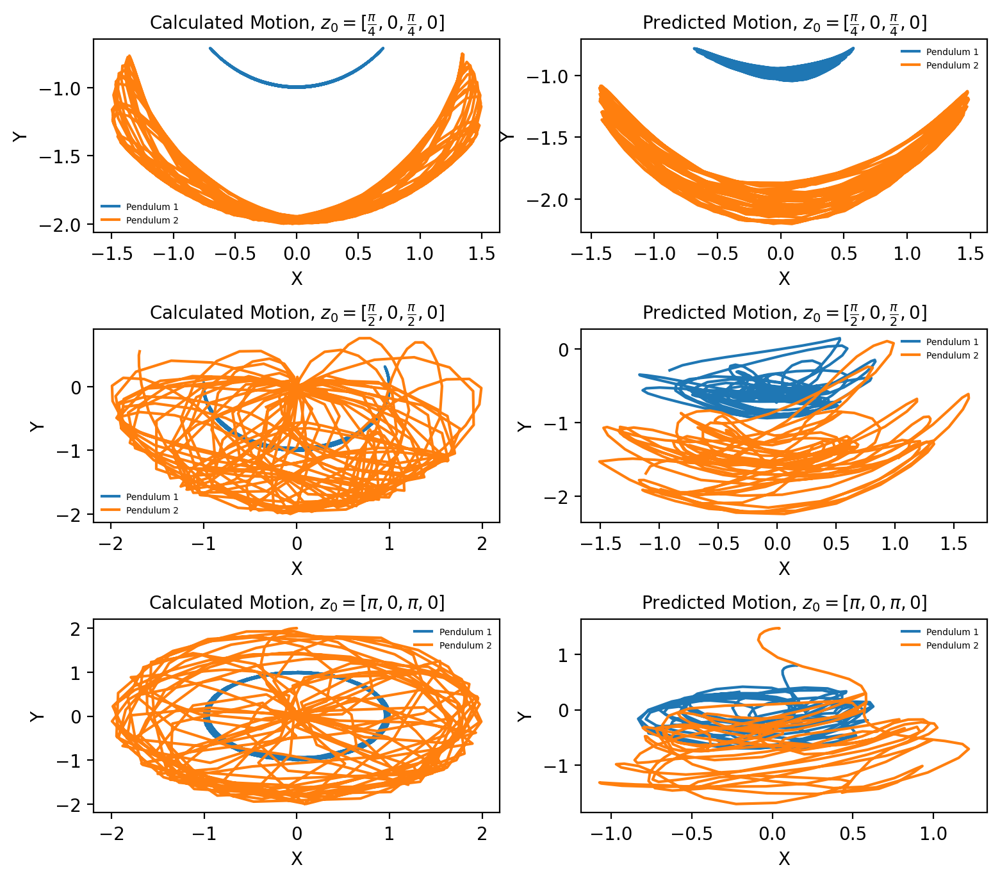

In [53]:
# A range of different initial conditions
z0_1 = [np.pi/4,0,np.pi/4,0]
z0_2 = [np.pi/2,0,np.pi/2,0]
z0_3 = [np.pi,0,np.pi,0]

# Generate x and y values for each pendulum
x1_1, y1_1, x2_1, y2_1, x1_pred_1, y1_pred_1, x2_pred_1, y2_pred_1 = varyz02(z0_1, model2)
x1_2, y1_2, x2_2, y2_2, x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2 = varyz02(z0_2, model2)
x1_3, y1_3, x2_3, y2_3, x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3 = varyz02(z0_3, model2)

# Create a figure with 2 rows and 3 columns of subplots
plt.subplots(nrows=2, ncols=3, figsize=(9, 8))

# Plot the solved version
plt.subplot(3, 2, 1)
plt.subplots_adjust(hspace=0.5, wspace=0.2)
plt.title(r'Calculated Motion, $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$', fontsize=10)
plt.plot(x1_1, y1_1, label='Pendulum 1')
plt.plot(x2_1, y2_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 2)
plt.title(r'Predicted Motion, $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$', fontsize=10)
plt.plot(x1_pred_1, y1_pred_1, label='Pendulum 1')
plt.plot(x2_pred_1, y2_pred_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 3)
plt.title(r'Calculated Motion, $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$', fontsize=10)
plt.plot(x1_2, y1_2, label='Pendulum 1')
plt.plot(x2_2, y2_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 4)
plt.title(r'Predicted Motion, $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$', fontsize=10)
plt.plot(x1_pred_2, y1_pred_2, label='Pendulum 1')
plt.plot(x2_pred_2, y2_pred_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 5)
plt.title(r'Calculated Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_3, y1_3, label='Pendulum 1')
plt.plot(x2_3, y2_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 6)
plt.title('Predicted Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_pred_3, y1_pred_3, label='Pendulum 1')
plt.plot(x2_pred_3, y2_pred_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

**Observations**

The above plots show that the model does not perform very well when z0 is varied. Comparing with the original model, trained on both m1 and m2 data, these predictions are a lot worse.

**Plotting Deviations**

In [54]:
def getDeviations2(no_of_offsets=5, z0=[np.pi/4,0,np.pi/4,0]):
  '''
  Function to get a range of different deviation metrics for a model and initial conditions
  Inputs: no_of_offsets, z0
  Outputs: preds, deviation metrics
  '''

  # Generate some offsets to test
  test_offsets = np.linspace(20,100, no_of_offsets).astype(int)

  # Initialise
  test_loss_arr = []
  mse_arr = []
  mae_arr = []
  rmse_arr = []
  r2_arr = []

  # Loop through test offsets
  for test_offset in test_offsets:

    # Generate test array
    #testarr, testlabs = getInputsLabels(windowsize=20, offset=test_offset, z0=z0)
    train_input, train_label, test_input, test_label = getTestTrain2(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

    # Update
    print('--------------------------------------------')
    print(f'TEST OFFSET: {test_offset}' )
    print('--------------------------------------------')

    # Train new model
    model, costs, steps = generateAndTrain2(train_input, train_label, neurons=32, steps=32, verbose=0)

    # Loss
    test_loss = model.evaluate(test_input, test_label, verbose=1)

    # Generate predictions
    preds = modelPreds(model, test_input, windowsize=20, single=True, no_inputs=2)

    # Deviations  
    mse = mean_squared_error(preds, test_label)
    mae = mean_absolute_error(preds,test_label)
    rmse = np.sqrt(mse)
    r2 = r2_score(preds, test_label)

    # Put in an array
    mse_arr.append(mse)
    mae_arr.append(mae)
    rmse_arr.append(rmse)
    r2_arr.append(r2)

    test_loss_arr.append(test_loss)

  return preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr

In [55]:
# Get our deviations
preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr  = getDeviations2(no_of_offsets=no_of_offsets,z0=[np.pi/4,0,np.pi/4,0])

--------------------------------------------
TEST OFFSET: 20
--------------------------------------------
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_23 (LSTM)              (None, 32)                4480      
                                                                 
 dense_23 (Dense)            (None, 4)                 132       
                                                                 
Total params: 4,612
Trainable params: 4,612
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 5ms/step - loss: 0.0132
--------------------------------------------
TEST OFFSET: 28
--------------------------------------------
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_24 (LS

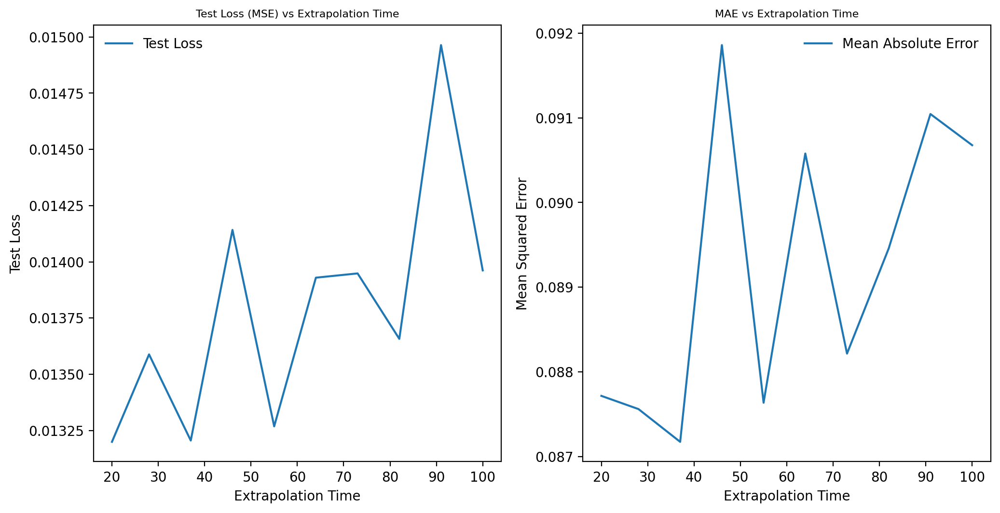

In [56]:
# Plotting
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
fig.subplots_adjust(wspace=0.2)

# Test Loss
axs[0].set_title("Test Loss (MSE) vs Extrapolation Time", fontsize=8)
axs[0].plot(test_offsets, test_loss_arr, label='Test Loss')
axs[0].set_xlabel('Extrapolation Time')
axs[0].set_ylabel('Test Loss')
axs[0].legend()

# MAE
axs[1].set_title("MAE vs Extrapolation Time", fontsize=8)
axs[1].plot(test_offsets, mae_arr, label='Mean Absolute Error')
axs[1].set_xlabel('Extrapolation Time')
axs[1].set_ylabel('Mean Squared Error')
axs[1].legend()

**Observations**

Once again, it does not seem easier for the model to predict any particular time in the future compared to another.

**Varying the training initial conditions**

In [57]:
def varyAndTrainz02(z0):

  '''
  Function that allows changing of the initial conditions
  Inputs: z0, model
  Outputs: x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred
  '''

  #Time ranges
  tmax, dt = 50, 0.1
  t = np.arange(0, tmax+dt, dt)

  # Solve initial value problem
  ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
  z=ret.y

  # Extract result
  theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
  x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

  # Get train and test set
  train_input, train_label, test_input, test_label = getTestTrain2(x1, y1, x2, y2, z0=z0, windowsize=20, offset=20)

  # Generate and train
  model, costs, steps = generateAndTrain2(train_input, train_label, neurons=128, steps=50)

  # Get model predictions
  x1_pred, y1_pred, x2_pred, y2_pred = modelPreds(model, test_input, windowsize=20, no_inputs=2)

  # Separate
  x1_test = test_input[:,0][:,0]
  y1_test = test_input[:,0][:,1]
  x2_test = test_input[:,0][:,2]
  y2_test = test_input[:,0][:,3]

  return x1_test, y1_test, x2_test, y2_test, x1_pred, y1_pred, x2_pred, y2_pred, costs, steps, test_label, model

In [58]:
x1, y1, x2, y2, x1_pred, y1_pred, x2_pred, y2_pred, costs, steps, test_label, model2 = varyAndTrainz0(z0new)

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 128)               68096     
                                                                 
 dense_33 (Dense)            (None, 4)                 516       
                                                                 
Total params: 68,612
Trainable params: 68,612
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
9/9 [==============================] - 4s 38ms/step - loss: 0.5983
Epoch 2/50
9/9 [==============================] - 0s 54ms/step - loss: 0.4417
Epoch 3/50
9/9 [==============================] - 1s 58ms/step - loss: 0.3934
Epoch 4/50
9/9 [==============================] - 1s 63ms/step - loss: 0.3825
Epoch 5/50
9/9 [==============================] - 1s 63ms/step - loss: 0.3617
Epoch 6/50
9/9 [==============================] - 1s 62

**Plotting Model Trained on $z_0=[\pi/2,0,\pi/2,0]$ initial conditions**

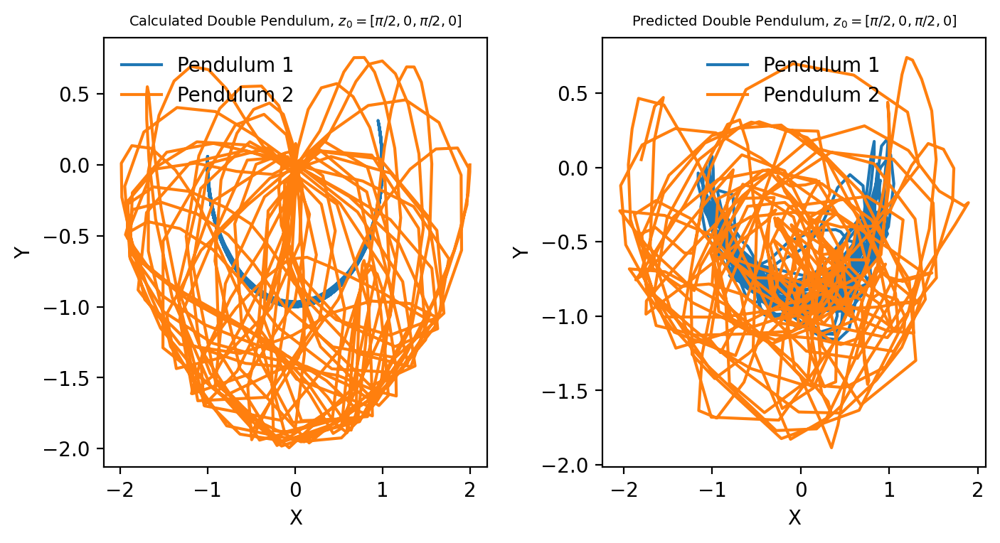

In [59]:
# Create a figure with 2 rows and 2 columns of subplots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Create two subplots side by side
axs[0].set_title(r'Calculated Double Pendulum, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=7)
axs[0].plot(x1,y1, label='Pendulum 1')
axs[0].plot(x2, y2, label='Pendulum 2')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].legend()

axs[1].set_title(r'Predicted Double Pendulum, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=7)
axs[1].plot(x1_pred, y1_pred, label='Pendulum 1')
axs[1].plot(x2_pred, y2_pred, label='Pendulum 2')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].legend()

# Add more space between the subplots
plt.subplots_adjust(wspace=0.3)

plt.show()

In [60]:
# Split into test labels
x1_test_label = test_label[:,0]
y1_test_label = test_label[:,1]
x2_test_label = test_label[:,2]
y2_test_label = test_label[:,3]

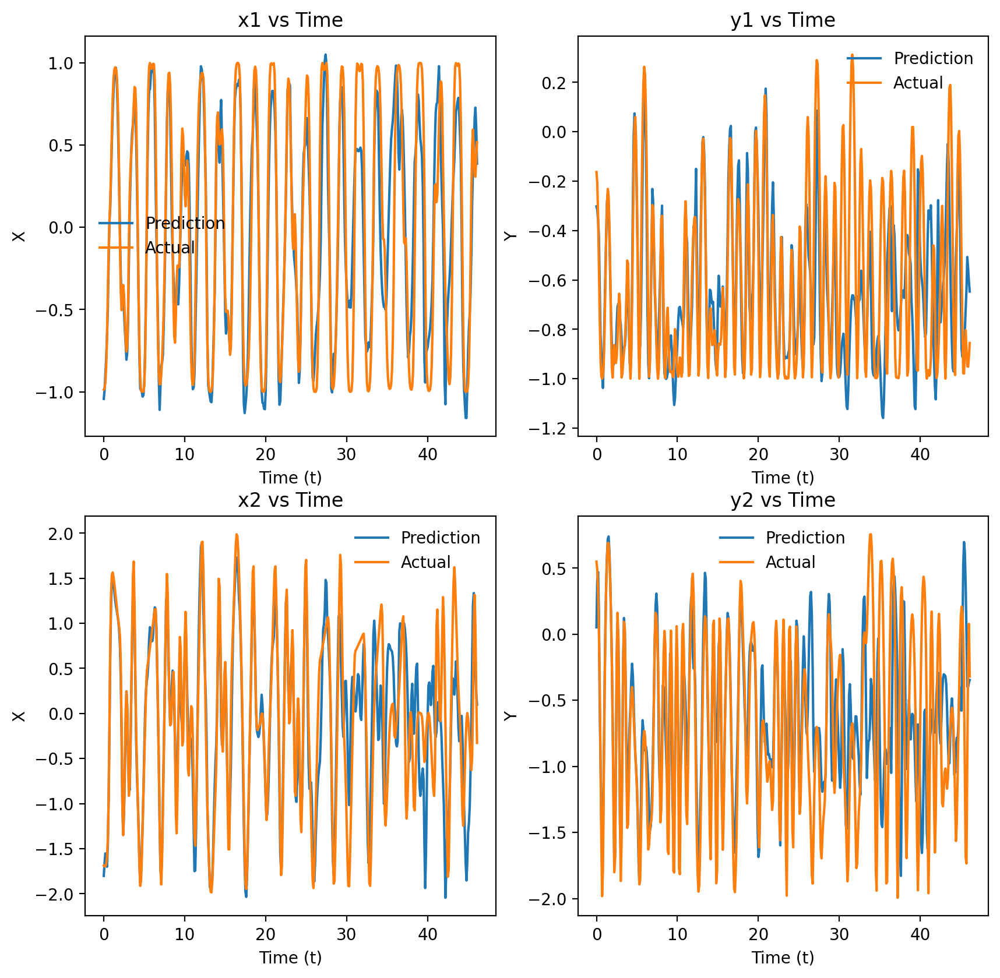

In [61]:
# Plot coords vs time
plotVsTime(x1_pred, y1_pred, x2_pred, y2_pred, x1_test_label, y1_test_label, x2_test_label, y2_test_label)

**Vary testing initial z0 conditions**

Again, we test the model on datasets with the same three initial z0 conditions as before.

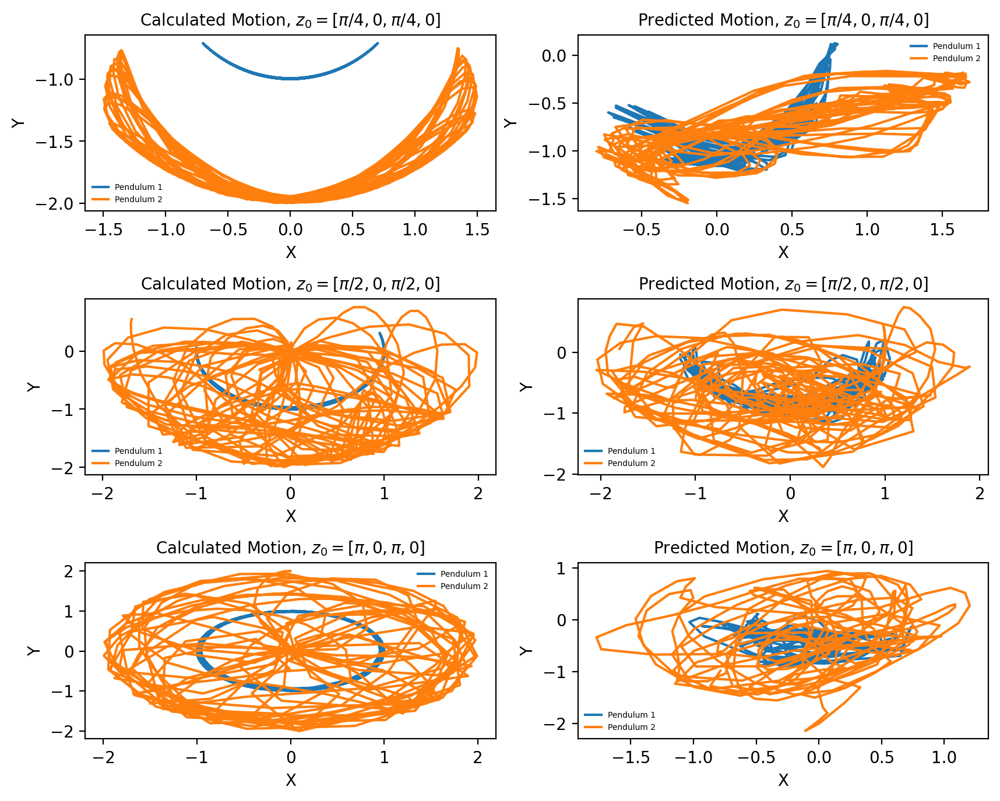

In [62]:
# A range of different initial conditions
z0_1 = [np.pi/4,0,np.pi/4,0]
z0_2 = [np.pi/2,0,np.pi/2,0]
z0_3 = [np.pi,0,np.pi,0]

# Generate x and y values for each pendulum
x1_1, y1_1, x2_1, y2_1, x1_pred_1, y1_pred_1, x2_pred_1, y2_pred_1 = varyz0(z0_1, model2)
x1_2, y1_2, x2_2, y2_2, x1_pred_2, y1_pred_2, x2_pred_2, y2_pred_2 = varyz0(z0_2, model2)
x1_3, y1_3, x2_3, y2_3, x1_pred_3, y1_pred_3, x2_pred_3, y2_pred_3 = varyz0(z0_3, model2)

# Create a figure with 2 rows and 3 columns of subplots
plt.subplots(nrows=2, ncols=3, figsize=(10, 8))

# Plot the solved version
plt.subplot(3, 2, 1)
plt.subplots_adjust(hspace=0.5, wspace=0.2)
plt.title(r'Calculated Motion, $z_0 = [\pi/4, 0, \pi/4, 0]$', fontsize=10)
plt.plot(x1_1, y1_1, label='Pendulum 1')
plt.plot(x2_1, y2_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 2)
plt.title(r'Predicted Motion, $z_0 = [\pi/4, 0, \pi/4, 0]$', fontsize=10)
plt.plot(x1_pred_1, y1_pred_1, label='Pendulum 1')
plt.plot(x2_pred_1, y2_pred_1, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 3)
plt.title(r'Calculated Motion, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=10)
plt.plot(x1_2, y1_2, label='Pendulum 1')
plt.plot(x2_2, y2_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 4)
plt.title(r'Predicted Motion, $z_0 = [\pi/2, 0, \pi/2, 0]$', fontsize=10)
plt.plot(x1_pred_2, y1_pred_2, label='Pendulum 1')
plt.plot(x2_pred_2, y2_pred_2, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the solved version
plt.subplot(3, 2, 5)
plt.title(r'Calculated Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_3, y1_3, label='Pendulum 1')
plt.plot(x2_3, y2_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

# Plot the networks version
plt.subplot(3, 2, 6)
plt.title(r'Predicted Motion, $z_0 = [\pi, 0, \pi, 0]$', fontsize=10)
plt.plot(x1_pred_3, y1_pred_3, label='Pendulum 1')
plt.plot(x2_pred_3, y2_pred_3, label='Pendulum 2')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(fontsize=5)

**Observations**

Again, the model performs better on the initial conditins that it is trained on, but it is still worse than if the model was trained on both m1 and m2 positions.

In [63]:
preds, test_loss_arr, mse_arr, mae_arr, rmse_arr, r2_arr  = getDeviations2(no_of_offsets=no_of_offsets,z0=[np.pi/2,0,np.pi/2,0])

--------------------------------------------
TEST OFFSET: 20
--------------------------------------------
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_34 (LSTM)              (None, 32)                4480      
                                                                 
 dense_34 (Dense)            (None, 4)                 132       
                                                                 
Total params: 4,612
Trainable params: 4,612
Non-trainable params: 0
_________________________________________________________________
15/15 [==============================] - 1s 4ms/step - loss: 0.3382
--------------------------------------------
TEST OFFSET: 28
--------------------------------------------
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_35 (LS

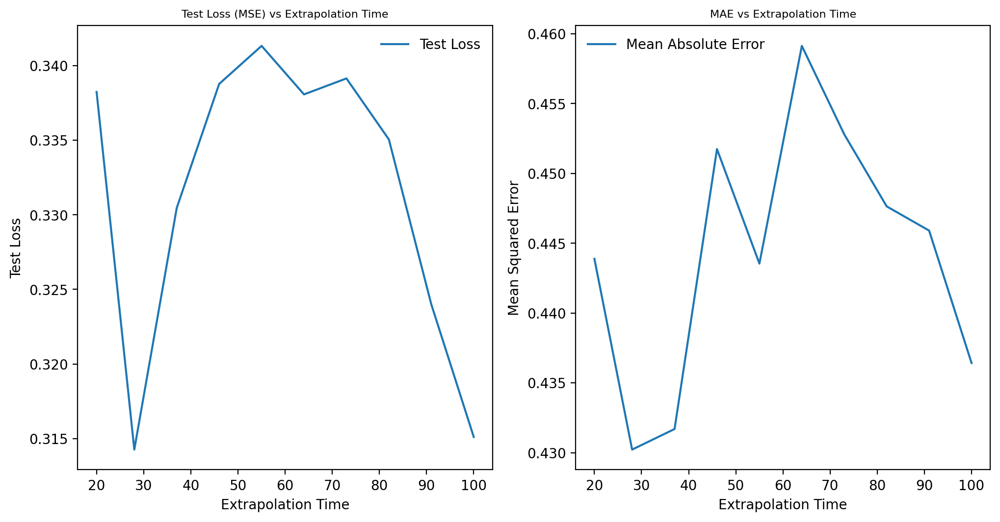

In [64]:
# Plotting
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
fig.subplots_adjust(wspace=0.2)

# Test Loss
axs[0].set_title("Test Loss (MSE) vs Extrapolation Time", fontsize=8)
axs[0].plot(test_offsets, test_loss_arr, label='Test Loss')
axs[0].set_xlabel('Extrapolation Time')
axs[0].set_ylabel('Test Loss')
axs[0].legend()

# MAE
axs[1].set_title("MAE vs Extrapolation Time", fontsize=8)
axs[1].plot(test_offsets, mae_arr, label='Mean Absolute Error')
axs[1].set_xlabel('Extrapolation Time')
axs[1].set_ylabel('Mean Squared Error')
axs[1].legend()

**Observations**

No clear trend again, so we may conclude from this that at least within the range 20 to 100 offset, there is not really a clear trend in deviations between prediction and expectation for any version of the RNN model tested here.

**Overall Conclusions**

Overall, we may conclude a few things:

- It is no easier or harder (at least not clearly) for the RNN network to predict any particular time in the future
- Training on both m1 and m2 positions provides closer predictions to the calculated pendulum motion
- It is quite difficult (as far as we have seen) for the model to generalise predictions to different initial $z_0$ conditions